# Manuscript Figures

The purpose of this notebook is to generate all figures associated with the **"A Classification-based Methodology for Streamlined Approximation of Binary Critical Micelle Concentrations"** manuscript and to serve as a demo for readers to use as reference material for the DoE-based methods.

In [1]:
import warnings
warnings.filterwarnings("ignore")

# Libraries

In [2]:
!pip install pycse

In [3]:
!pip install orjson

In [4]:
!pip install --upgrade "kaleido"

# Imports

In [5]:
import random
import numpy as np
import pandas as pd

from scipy.odr import *
from scipy import interpolate
from scipy.optimize import fsolve

from pycse import nlinfit

import kaleido
from PIL import Image

import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as GO
from plotly.subplots import make_subplots

def shuffle(L): return random.Random(0).shuffle(L)

# Plot Configurations

In [6]:
!mkdir ../figures

mkdir: ../figures: File exists


In [7]:
''' specifying matplotlib figure dimensions '''
W, H = 4, 6

# Design Figures

## Utilities

In [8]:
def cmc_relation(beta, x_1M, cmc_1, cmc_2, cmc_mixed):

  f_1, f_2 = np.exp(beta * (x_1M)**2), np.exp(beta * (1 - x_1M)**2)

  return x_1M * cmc_1 * f_2 + (1 - x_1M) * cmc_2 * f_1 - cmc_mixed

In [9]:
def beta_relation(x_1, x_1M, cmc_1, cmc_2, cmc_mixed):

  beta_equn_term_1 = x_1M**2 * np.log((x_1 * cmc_mixed) / (x_1M * cmc_1))
  beta_equn_term_2 = (1 - x_1M)**2 * np.log(((1 - x_1) * cmc_mixed) / ((1 - x_1M) * cmc_2))

  return beta_equn_term_1 - beta_equn_term_2

In [10]:
def nonideal_solution_theory(params, args):
  x_1M, cmc_mixed = params
  beta, x_1, cmc_1, cmc_2 = args

  return [cmc_relation(beta, x_1M, cmc_1, cmc_2, cmc_mixed),
          beta_relation(x_1, x_1M, cmc_1, cmc_2, cmc_mixed)]

In [11]:
def distance_formula(x1, y1, x2, y2): return np.sqrt((x2-x1)**2 + (y2-y1)**2)

In [12]:
def zero_interaction_line(x, cmc_1, cmc_2): return (-1 * cmc_2 / cmc_1) * (x - cmc_1)

## Design of Experiments Setup

In [13]:
''' defining surfactant #1 as SDS, surfactant #2 as C8E4 '''
cmc_1, cmc_2        = 8.00, 9.33   # mM
initial_beta_guess  = -3.1         # literature-value

''' using fsolve with the nonideal solution theory implicit solutions
to approximate the binary surfactant mixed cmc over all mole fractions '''
points = {}
beta_sampling = np.linspace(2 * initial_beta_guess, 0, 7)
# looping through potiential interaction parameters
for beta in np.round(beta_sampling, 1):
  curr_beta_curve = []
  # looping through bulk solution surfactant mole fractions
  for x_1 in np.linspace(0.0005, 0.9995, 100):
    curr_solutions = []
    # iterating thru potiential initial guesses to support fsolve convergence
    for mixed_cmc_guess in np.linspace(5, 95, 10):
      for x_1M_guess in np.linspace(0.15, 0.85, 10):
        x_1M, mixed_cmc = fsolve(nonideal_solution_theory,
              [x_1M_guess, mixed_cmc_guess], args=[beta, x_1, cmc_1, cmc_2])

        # need to verify fsolve solution
        if (cmc_relation(beta, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8
          and beta_relation(x_1, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8):
          curr_solutions.append(mixed_cmc)

    try:
      curr_beta_curve.append((x_1 * curr_solutions[0], (1 - x_1) * curr_solutions[0]))
    except IndexError: pass

  points[beta] = curr_beta_curve

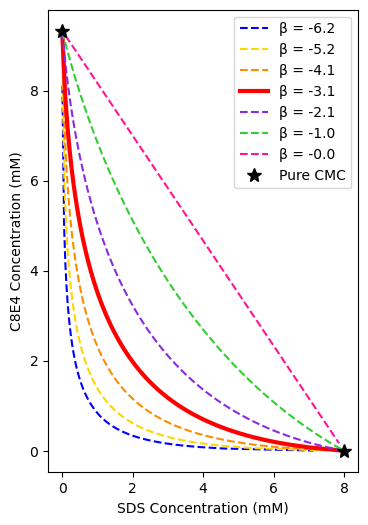

In [14]:
fig, ax = plt.subplots()

colors = ["red", "darkorange", "gold", "limegreen", "blue", "blueviolet", "deeppink"]
shuffle(colors)

for i, beta_trial in enumerate(points):
  # filtering any fsolve extraneous solutions (bounding the zero interaction curve)
  points[beta_trial] = [(x, y) for x, y in points[beta_trial] if y <= zero_interaction_line(x, cmc_1, cmc_2)]

  # plotting the nonideal solution theory estimated mixed cmc results
  trial_name = "β = " + str(beta_trial)

  if beta_trial == -3.1:
    plt.plot([x for x, _ in points[beta_trial]], [y for _, y in points[beta_trial]],
             color=colors[i], linewidth=3)

  else:
    plt.plot([x for x, _ in points[beta_trial]], [y for _, y in points[beta_trial]],
             color=colors[i], linestyle="dashed", )

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")

ax.set_xticks(np.arange(0, 10, 2,))
ax.set_yticks(np.arange(0, 10, 2,))

plt.legend(["β = -6.2", "β = -5.2", "β = -4.1", "β = -3.1", "β = -2.1", "β = -1.0", "β = -0.0", "Pure CMC"])

plt.gcf().set_size_inches(W, H)

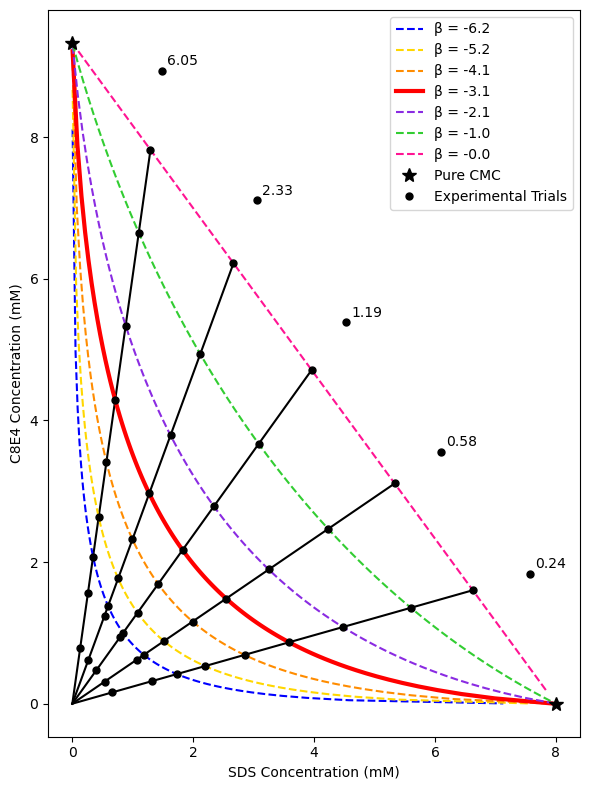

In [15]:
fig, ax = plt.subplots()

n_rays = 5
# plotting constant composition evenly-spaced ray lines (individual ReLU curves)

x_range = np.linspace(0, cmc_1, 100)
y_range = zero_interaction_line(x_range, cmc_1, cmc_2)

z = distance_formula(cmc_1, 0, 0, cmc_2)    # distance between two pure CMCs
section_length = z / (n_rays + 1)

compositions = []
for i in range(1, n_rays + 1):
  x_i, y_i = 0, 0
  arbitrary_min_value = 100.0
  curr_distance = i * section_length
  for v_x in np.linspace(0, cmc_1, 100):
    v_y = zero_interaction_line(v_x, cmc_1, cmc_2)

    z_i = np.abs(distance_formula(0, cmc_2, v_x, v_y) - curr_distance)
    if z_i < arbitrary_min_value:
      arbitrary_min_value = z_i
      x_i, y_i = v_x, v_y

  slope = y_i / x_i
  compositions.append(slope)

  plt.plot([0, x_i], [0, y_i], color="black", label="_rayline") # hiding label from legend

trials = {}
for chi in compositions: # looping through each proposed composition ray line

  curr_trials = []
  for beta_value in points: # looping through each individual beta curve
    tuple_xs, tuple_ys = zip(*points[beta_value])
    xs = list(tuple_xs)
    ys = list(tuple_ys)

    # finding intersection between beta curve and composition ray line
    f = interpolate.interp1d(xs, ys, "cubic")
    def intersection(x): return f(x) - chi * x
    solution = fsolve(intersection, x0=xs[0])

    # verifying the interpolated solution
    if (intersection(solution) < 1E-8):
      curr_trials.append((solution[0], chi * solution[0]))

  trials[chi] = curr_trials

colors = ["red", "darkorange", "gold", "limegreen", "blue", "blueviolet", "deeppink"]
shuffle(colors)

beta_labels = ["β = -6.2", "β = -5.2", "β = -4.1", "β = -3.1", "β = -2.1", "β = -1.0", "β = -0.0"]

for i, beta_trial in enumerate(points):
  # filtering any fsolve extraneous solutions (bounding the zero interaction curve)
  points[beta_trial] = [(x, y) for x, y in points[beta_trial] if y <= zero_interaction_line(x, cmc_1, cmc_2)]

  # plotting the nonideal solution theory estimated mixed cmc results
  trial_name = "β = " + str(beta_trial)

  if beta_trial == -3.1:
    plt.plot([x for x, _ in points[beta_trial]], [y for _, y in points[beta_trial]],
             color=colors[i], linewidth=3, label=beta_labels[i])

  else:
    plt.plot([x for x, _ in points[beta_trial]], [y for _, y in points[beta_trial]],
             color=colors[i], linestyle="dashed", label=beta_labels[i])


# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10, label="Pure CMC")

XS, YS = [], []
for chi in trials:
  tuple_xs, tuple_ys = zip(*trials[chi])
  xs = list(tuple_xs)
  ys = list(tuple_ys)

  # adding blank region samples
  blank_region_fractions = [0.2, 0.1]
  zero_interaction_x, zero_interaction_y = xs[-1], ys[-1]
  for v in blank_region_fractions:
    trials[chi].insert(0, (v * zero_interaction_x, v * zero_interaction_y))
    xs.insert(0, v * zero_interaction_x)
    ys.insert(0, v * zero_interaction_y)

  above_fraction = 8/7
  # adding trial definitely above the mixed cmc curves
  trials[chi].append((above_fraction * xs[-1], above_fraction * ys[-1]))
  high_x, high_y = above_fraction * xs[-1], above_fraction * ys[-1]

  xs.append(high_x)
  ys.append(high_y)
  XS.extend(xs)
  YS.extend(ys)

  # adding annotation for ray line blend ratio
  plt.annotate(
      f"{np.round(chi, 2)}",        # ray line blend ratio
      xy=(high_x, high_y),          # specified point to annotate
      xytext=(4, 4),                # distance from the point, in points
      textcoords="offset points",   # interpreting text position as offset in points from annotated point
      ha="left",                    # horizontal alignment
      va="baseline"                 # vertical alignment
  )

# plotting the proposed mixed surfactant trials
plt.plot(XS, YS, ".", color="black", markersize=10, label="Experimental Trials")

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")

ax.set_xticks(np.arange(0, 10, 2,))
ax.set_yticks(np.arange(0, 10, 2,))

plt.legend(loc="upper right")

plt.gcf().set_size_inches(W+2, H+2)
plt.tight_layout()
plt.savefig("../figures/fig-design.png", dpi=300)

## Experimental Setup

In [16]:
sds_stock = 9.6083          # mM
c8e4_stock = 11.0042        # mM

desired_stock_volume = 0.05 # L

rounded_compositions = []
mixed_stock_solution_makeup = {}
for chi in compositions:
  sds_volume = desired_stock_volume / (chi * (sds_stock / c8e4_stock) + 1)
  c8e4_volume = desired_stock_volume - sds_volume

  rounded_sds_volume = np.round(sds_volume * 1000, 1)       # rounded in mL
  rounded_c8e4_volume = np.round(c8e4_volume * 1000, 1)     # rounded in mL

  rounded_chi = np.round((rounded_c8e4_volume * c8e4_stock) / (rounded_sds_volume * sds_stock), 3)

  rounded_compositions.append(rounded_chi)
  mixed_stock_solution_makeup[rounded_chi] = (rounded_sds_volume, rounded_c8e4_volume)

# mixed_stock_solution_makeup   # in (SDS mL, C8E4 mL)

In [17]:
mixed_stock_concentrations = []

for chi in mixed_stock_solution_makeup:
  curr_mmol_sds = sds_stock * (mixed_stock_solution_makeup[chi][0] / 1000)
  curr_mmol_c8e4 = c8e4_stock * (mixed_stock_solution_makeup[chi][1] / 1000)

  mixed_stock_concentrations.append((curr_mmol_sds + curr_mmol_c8e4) / desired_stock_volume)

vial_volume = 0.0010   # L
mixed_trial_solution_makeup = {}
for i in range(len(rounded_compositions)): # number of mixed composition ray lines
  curr_chi_volumes = []
  for trial_number in range(10):
    # using the theorized values as basis for volume calculations
    trial_sds_concentration = trials[list(trials.keys())[i]][trial_number][0]
    trial_c8e4_concentration = trials[list(trials.keys())[i]][trial_number][1]

    mixed_trial_concentration = trial_sds_concentration + trial_c8e4_concentration
    mixed_volume = (mixed_trial_concentration * vial_volume) / mixed_stock_concentrations[i]
    fillup_volume = vial_volume - mixed_volume

    rounded_mixed_volume_mL = np.round(mixed_volume * 1000, 3)
    rounded_fillup_volume_mL = np.round(fillup_volume * 1000, 3)
    curr_chi_volumes.append((rounded_mixed_volume_mL, rounded_fillup_volume_mL))

  mixed_trial_solution_makeup[rounded_compositions[i]] = curr_chi_volumes

# mixed_trial_solution_makeup

In [18]:
''' generating my plate indicies '''
plate_index_1 = ["A", "B", "C", "D", "E", "F", "G", "H"]
plate_index_2 = [str(i) for i in range(1, 13)]

for _ in range(5): shuffle(plate_index_1); shuffle(plate_index_2);
plate_order = [letter + number for letter in plate_index_1 for number in plate_index_2]

''' generating sample labels '''
sample_labels = []
for chi in rounded_compositions:
  for trial in range(0, 9):   # first nine trials (excluding highest point trial)
    for replicate in range(2):
      sample_labels.append(str(chi) + "-" + str(trial + 1) + "-" + str(replicate + 1))

  sample_labels.append(str(chi) + "-" + str(10))    # adding tenth, high point trial

sample_labels.extend(["IFS"])

''' tabulating the plate setup '''
for _ in range(50): shuffle(plate_order)
for _ in range(150): shuffle(sample_labels)

data_dict = {"index" : plate_order, "sample_id" : sample_labels}
experiment_setup = pd.DataFrame(data_dict)

# experiment_setup

# Raw Data Visualization

### Data Preprocessing Utilities

In [19]:
def find_nearest_chi(X):
  closest_design_chi, min_value = 0, 1

  for design_chi in list(trials.keys()):    # finding the current ray line
    curr_proximity = np.abs(design_chi - float(X))

    if (curr_proximity < min_value):
      min_value = curr_proximity
      closest_design_chi = design_chi

  return closest_design_chi

In [20]:
''' unpacks trial labels (from the results_table dataframe), according to the specified design above '''
def map_results(results_table):
    ''' expanding the sample_id column to its chi, trial number, and replicate '''
    sample_type, trial_n, sds_concentration, c8e4_concentration, replicate_n = [], [], [], [], []
    for label in results_table["sample_id"]:
        label_info = label.split("-")

        sample_type.append(label_info[0])

        if label_info[0] == "IFS":
            trial_n.append(int(0))
            sds_concentration.append(int(0))
            c8e4_concentration.append(int(0))
            replicate_n.append(int(0))

        else:
            trial_n.append(int(label_info[1]))

            design_chi = find_nearest_chi(label_info[0])
            design_sds_pt, design_c8e4_pt = trials[design_chi][int(label_info[1]) - 1]

            avg_sds_pt = (design_sds_pt + design_c8e4_pt / design_chi) / 2
            avg_c8e4_pt = (design_c8e4_pt + design_chi * design_sds_pt) / 2

            sds_concentration.append(avg_sds_pt)
            c8e4_concentration.append(avg_c8e4_pt)

            if label_info[1] == "10": replicate_n.append(int(1))
            else: replicate_n.append(int(label_info[2]))

    ''' aggregating the current measurment sample information '''
    results = results_table.copy()
    results["type"] = sample_type
    results["trial_number"] = trial_n
    results["sds_concentration"] = sds_concentration
    results["c8e4_concentration"] = c8e4_concentration
    results["replicate"] = replicate_n

    return results

In [21]:
''' @brief reads in the raw excel file, matches plate indicies to measured
      fluorescence values, and uses map_results() to unpack trial labels '''
def read_microplate_data(filename, experiment_setup):
    ''' formatting MicroPlate reader data '''
    data_table = pd.read_excel(filename)

    ''' dropping useless first column from dataframes '''
    data_table = data_table.iloc[:, 1:]

    ''' dropping useless last column from results dataframe '''
    data_table = data_table.iloc[:, :-1]

    ''' reindexing the table to match plate indicies '''
    data_table.index = ["A", "B", "C", "D", "E", "F", "G", "H"]

    ''' mapping tabular fluorescence results into reformatted dataframe '''
    results_mapping = []
    for letter_index in data_table.index:
        for number_index in data_table.columns:
            item = (letter_index, str(number_index), data_table[number_index][letter_index])
            results_mapping.append(item)

    fluorescence_table = pd.DataFrame(results_mapping, columns=["row", "column", "fluorescence"])

    ''' reformatting the experiment_setup to match format of fluorescence_table '''
    labels = experiment_setup["sample_id"].tolist()
    indicies = [(plate_index[0], plate_index[1:])for plate_index in experiment_setup["index"].tolist()]
    experiment_design_setup = pd.DataFrame(indicies, columns=["row", "column"])
    experiment_design_setup["sample_id"] = labels

    ''' joining design_table and fluorescence_table '''
    results_table = pd.merge(experiment_design_setup, fluorescence_table,  how='left',
                        left_on=["row", "column"], right_on = ["row", "column"])

    output_table = map_results(results_table)

    return output_table

### Data Aggregation

In [22]:
mp_measure_1 = read_microplate_data("06152023-binary-sds-c8e4-mp-1.xlsx", experiment_setup)
mp_measure_2 = read_microplate_data("06152023-binary-sds-c8e4-mp-2.xlsx", experiment_setup)
mp_measure_3 = read_microplate_data("06152023-binary-sds-c8e4-mp-3.xlsx", experiment_setup)
mp_measure_4 = read_microplate_data("06152023-binary-sds-c8e4-mp-4.xlsx", experiment_setup)
mp_measure_5 = read_microplate_data("06152023-binary-sds-c8e4-mp-5.xlsx", experiment_setup)

mp_data_1 = np.array(mp_measure_1["fluorescence"])
mp_data_2 = np.array(mp_measure_2["fluorescence"])
mp_data_3 = np.array(mp_measure_3["fluorescence"])
mp_data_4 = np.array(mp_measure_4["fluorescence"])
mp_data_5 = np.array(mp_measure_5["fluorescence"])

microplate_table = pd.DataFrame()
microplate_table["row"] = mp_measure_1["row"]
microplate_table["column"] = mp_measure_1["column"]
microplate_table["sample_id"] = mp_measure_1["sample_id"]

microplate_table["type"] = mp_measure_1["type"]
microplate_table["trial_number"] = mp_measure_1["trial_number"]
microplate_table["replicate"] = mp_measure_1["replicate"]

microplate_table["sds_concentration"] = mp_measure_1["sds_concentration"]
microplate_table["c8e4_concentration"] = mp_measure_1["c8e4_concentration"]

microplate_table["scan-1"] = mp_data_1
microplate_table["scan-2"] = mp_data_2
microplate_table["scan-3"] = mp_data_3
microplate_table["scan-4"] = mp_data_4
microplate_table["scan-5"] = mp_data_5

microplate_table["average_fluorescence"] = np.mean(
    [mp_data_1, mp_data_2, mp_data_3, mp_data_4, mp_data_5], axis=0)

microplate_table["fluorescence_stdev"] = np.std(
    [mp_data_1, mp_data_2, mp_data_3, mp_data_4, mp_data_5], axis=0, dtype=np.float64)

''' normalizing by internal fluorescence standard '''
ifs = np.mean(microplate_table[microplate_table["type"] == "IFS"]["average_fluorescence"])
microplate_table.drop(microplate_table[microplate_table["type"] == "IFS"].index, inplace=True)

microplate_table["normalized_fluorescence"] = microplate_table["average_fluorescence"] / ifs

### Data Visualization

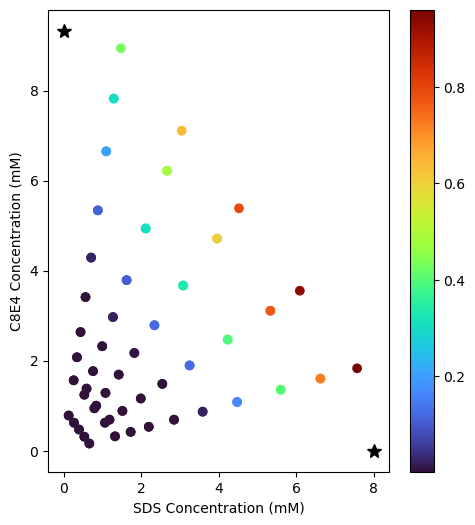

In [23]:
fig, ax = plt.subplots()

X = microplate_table["sds_concentration"]
Y = microplate_table["c8e4_concentration"]
im = ax.scatter(X, Y, c=microplate_table["normalized_fluorescence"], cmap=plt.cm.turbo)

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

# add a colorbar
fig.colorbar(im, ax=ax)

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")

ax.set_xticks(np.arange(0, 10, 2,))
ax.set_yticks(np.arange(0, 10, 2,))

plt.gcf().set_size_inches(W+1.5, H)
plt.savefig('../figures/fig-binary.png', dpi=300)

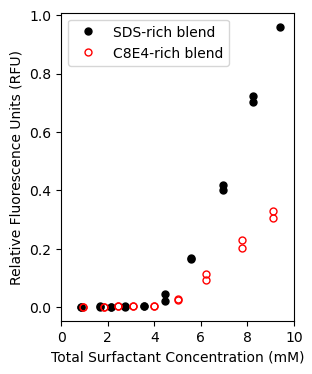

In [24]:
# blends: 6.013, 2.325, 1.192, 0.585, 0.241
blend_data1  = microplate_table[microplate_table["type"] == "0.241"]
X1           = blend_data1["sds_concentration"] + blend_data1["c8e4_concentration"]
Y1           = blend_data1["normalized_fluorescence"]

blend_data2  = microplate_table[microplate_table["type"] == "6.013"]
X2           = blend_data2["sds_concentration"] + blend_data2["c8e4_concentration"]
Y2           = blend_data2["normalized_fluorescence"]


# adding pure surfactant CMCs
plt.plot(X1, Y1, ".", color="black", markersize=10)
plt.plot(X2, Y2, ".", color="red", markersize=10, fillstyle="none")

plt.xlim(0.0, 10.0)
plt.xlabel("Total Surfactant Concentration (mM)")
plt.ylabel("Relative Fluorescence Units (RFU)")

plt.legend(["SDS-rich blend", "C8E4-rich blend"], loc="best")

plt.gcf().set_size_inches(W-1, H-2)

### Plotly 3D Plots

Supplemental 3D plots for completeness.

In [25]:
def rotate_z(x, y, z, theta):

    w = x + 1j * y

    return np.real(np.exp(1j * theta) * w), np.imag(np.exp(1j * theta) * w), z

In [26]:
!mkdir figures/3D
fig = GO.Figure()

x = microplate_table["sds_concentration"]
y = microplate_table["c8e4_concentration"]
z = microplate_table["average_fluorescence"]

fig.add_trace(GO.Scatter3d(x=x, y=y, z=z, mode="markers",
    marker=dict(size=8, color=microplate_table["average_fluorescence"],
    cmax=max(microplate_table["average_fluorescence"]), cmin=0,
    #colorbar=dict(title="", titleside="bottom", orientation='h'),
    colorscale="turbo")))

for i, t in enumerate(np.arange(0, 2 * np.pi, np.pi / 4)):
    xe, ye, ze = rotate_z(1, 2, 1, -t)

    fig.update_layout(scene=dict(
        xaxis_title="SDS (mM)",
        yaxis_title="C8E4 (mM)",
        zaxis_title="RFU"),
        scene_camera_eye=dict(x=xe, y=ye, z=ze),
        margin=dict(l=0, r=0, t=0, b=0),
        showlegend=False)

    fig.show()

    fig.write_image("figures/3D/ANGLE_" + str(i) + ".png", engine="kaleido", width=600, height=400, scale=2.0)

mkdir: figures/3D: File exists


# Analysis Configurations

In [27]:
analysis_table = microplate_table

# ReLU Analysis

In [28]:
relu_results = {}
relu_errors = []

def leaky_relu(x, a): return np.where(x > 0, x, a * x)

def model(x, i0, a, m, cmc):
  if a >= 0: return i0 + m * leaky_relu(x - cmc, a)   # positive lower elbow slope constraint
  return np.inf

param_list = []

## $\chi = 6.013$

In [29]:
temp_chi = 6.013
n_replicates = 2
fig = make_subplots(rows=n_replicates, cols=1, subplot_titles=("Replicate 1", "Replicate 2"))

params, errors = [], []
for i in range(n_replicates):
  temp_table = analysis_table[analysis_table["type"] == str(temp_chi)]
  temp_table["total_concentration"] = temp_table["sds_concentration"] + temp_table["c8e4_concentration"]

  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  p, pint, se = nlinfit(model, x, y, [0, 0, 0.05, 4.5])    # initial guesses
  params.append(p)
  errors.append(se)

  # plotting individual trial model
  X = np.linspace(0, 15, 100)
  fig.add_trace(GO.Scatter(x=X, y=model(X, p[0], p[1], p[2], p[3]),
      name="Replicate #" + str(i+1) + " Model", mode="lines",
      marker=dict(color="green")), row=i+1, col=1)

  # plotting trial data
  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1),
      mode="markers", marker=dict(color="green")), row=i+1, col=1)

p1, p2, p3, p4 = 0, 0, 0, 0
e1, e2, e3, e4 = 0, 0, 0, 0

# averaging the replicate trials
for i in range(n_replicates):
  p1 += params[i][0]; p2 += params[i][1]; p3 += params[i][2]; p4 += params[i][3]
  e1 += errors[i][0]; e2 += errors[i][1]; e3 += errors[i][2]; e4 += errors[i][3]

p1 /= n_replicates; p2 /= n_replicates; p3 /= n_replicates; p4 /= n_replicates;
e1 /= n_replicates; e2 /= n_replicates; e3 /= n_replicates; e4 /= n_replicates;

''' converting predicted total values into SDS and C8E4 concentrations '''
predicted_sds_concentration = p4 / (temp_chi + 1)
predicted_c8e4_concentration = p4 / (1 + 1 / temp_chi)
relu_results[temp_chi] = (predicted_sds_concentration, predicted_c8e4_concentration)
relu_errors.append((e4 / (temp_chi + 1), e4 / (1 + 1 / temp_chi)))

print("Averaged Model Parameters and Parameter Errors:")
print(f"PARAMS: {[p1, p2, p3, p4]}")
print(f"ERRORS: {[e1, e2, e3, e4]}")

fig.update_layout(
    title_text="𝜒 = " + str(temp_chi),
    xaxis_title="Total Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16),
    showlegend=False)

fig.show()

param_list.append([p1, p2, p3, p4])

Averaged Model Parameters and Parameter Errors:
PARAMS: [0.010528878894868315, 0.03197045020428408, 0.07287604368323251, 4.908011844339371]
ERRORS: [0.005585664146574025, 0.029334087889682996, 0.0019070590792140542, 0.11675927821023167]


In [30]:
fig = GO.Figure()

# adding trial data points
for i in range(n_replicates):
  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1), mode="markers"))

# adding trendline curve
fig.add_trace(GO.Scatter(x=X, y=model(X, *(p1, p2, p3, p4)), name="ReLU Trendline", mode="lines"))

# adding vertical line for predicted CMC
fig.add_vline(x=p4, line={"dash" : "dash"})

fig.update_layout(
    title="Constrained Leaky (Mean) ReLU Analysis for 𝜒 = " + str(temp_chi),
    xaxis_title="Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16))

fig.show()

## $\chi = 2.325$

In [31]:
temp_chi = 2.325
n_replicates = 2
fig = make_subplots(rows=n_replicates, cols=1, subplot_titles=("Replicate 1", "Replicate 2"))

params, errors = [], []
for i in range(n_replicates):
  temp_table = analysis_table[analysis_table["type"] == str(temp_chi)]
  temp_table["total_concentration"] = temp_table["sds_concentration"] + temp_table["c8e4_concentration"]

  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  p, pint, se = nlinfit(model, x, y, [0, 0, 0.05, 4.25])    # initial guesses
  params.append(p)
  errors.append(se)

  # plotting individual trial model
  X = np.linspace(0, 10.5, 100)
  fig.add_trace(GO.Scatter(x=X, y=model(X, p[0], p[1], p[2], p[3]),
      name="Replicate #" + str(i+1) + " Model", mode="lines",
      marker=dict(color="green")), row=i+1, col=1)

  # plotting trial data
  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1),
      mode="markers", marker=dict(color="green")), row=i+1, col=1)

p1, p2, p3, p4 = 0, 0, 0, 0
e1, e2, e3, e4 = 0, 0, 0, 0

# averaging the replicate trials
for i in range(n_replicates):
  p1 += params[i][0]; p2 += params[i][1]; p3 += params[i][2]; p4 += params[i][3]
  e1 += errors[i][0]; e2 += errors[i][1]; e3 += errors[i][2]; e4 += errors[i][3]

p1 /= n_replicates; p2 /= n_replicates; p3 /= n_replicates; p4 /= n_replicates;
e1 /= n_replicates; e2 /= n_replicates; e3 /= n_replicates; e4 /= n_replicates;

''' converting predicted total concentration into SDS and C8E4 concentrations '''
predicted_sds_concentration = p4 / (temp_chi + 1)
predicted_c8e4_concentration = p4 / (1 + 1 / temp_chi)
relu_results[temp_chi] = (predicted_sds_concentration, predicted_c8e4_concentration)
relu_errors.append((e4 / (temp_chi + 1), e4 / (1 + 1 / temp_chi)))

print("Averaged Model Parameters and Parameter Errors:")
print(f"PARAMS: {[p1, p2, p3, p4]}")
print(f"ERRORS: {[e1, e2, e3, e4]}")

fig.update_layout(
    title_text="𝜒 = " + str(temp_chi),
    xaxis_title="Total Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16),
    showlegend=False)

fig.show()

param_list.append([p1, p2, p3, p4])

Averaged Model Parameters and Parameter Errors:
PARAMS: [0.012102965539168807, 0.0319289770009281, 0.10939951257886532, 4.537274229940035]
ERRORS: [0.007065304087042178, 0.02637836265696048, 0.002467423931724137, 0.10305667369529338]


In [32]:
fig = GO.Figure()

# adding trial data points
for i in range(n_replicates):
  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1), mode="markers"))

# adding trendline curve
fig.add_trace(GO.Scatter(x=X, y=model(X, *(p1, p2, p3, p4)), name="ReLU Trendline", mode="lines"))

# adding vertical line for predicted CMC
fig.add_vline(x=p4, line={"dash" : "dash"})

fig.update_layout(
    title="Constrained Leaky (Mean) ReLU Analysis for 𝜒 = " + str(temp_chi),
    xaxis_title="Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16))

fig.show()

## $\chi = 1.192$

In [33]:
temp_chi = 1.192
n_replicates = 2
fig = make_subplots(rows=n_replicates, cols=1, subplot_titles=("Replicate 1", "Replicate 2"))

params, errors = [], []
for i in range(n_replicates):
  temp_table = analysis_table[analysis_table["type"] == str(temp_chi)]
  temp_table["total_concentration"] = temp_table["sds_concentration"] + temp_table["c8e4_concentration"]

  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  p, pint, se = nlinfit(model, x, y, [0, 0, 0.05, 4.15])    # initial guesses
  params.append(p)
  errors.append(se)

  # plotting individual trial model
  X = np.linspace(0, 10, 100)
  fig.add_trace(GO.Scatter(x=X, y=model(X, p[0], p[1], p[2], p[3]),
      name="Replicate #" + str(i+1) + " Model", mode="lines",
      marker=dict(color="green")), row=i+1, col=1)

  # plotting trial data
  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1),
      mode="markers", marker=dict(color="green")), row=i+1, col=1)

p1, p2, p3, p4 = 0, 0, 0, 0
e1, e2, e3, e4 = 0, 0, 0, 0

# averaging the replicate trials
for i in range(n_replicates):
  p1 += params[i][0]; p2 += params[i][1]; p3 += params[i][2]; p4 += params[i][3]
  e1 += errors[i][0]; e2 += errors[i][1]; e3 += errors[i][2]; e4 += errors[i][3]

p1 /= n_replicates; p2 /= n_replicates; p3 /= n_replicates; p4 /= n_replicates;
e1 /= n_replicates; e2 /= n_replicates; e3 /= n_replicates; e4 /= n_replicates;

''' converting predicted total concentration into SDS and C8E4 concentrations '''
predicted_sds_concentration = p4 / (temp_chi + 1)
predicted_c8e4_concentration = p4 / (1 + 1 / temp_chi)
relu_results[temp_chi] = (predicted_sds_concentration, predicted_c8e4_concentration)
relu_errors.append((e4 / (temp_chi + 1), e4 / (1 + 1 / temp_chi)))

print("Averaged Model Parameters and Parameter Errors:")
print(f"PARAMS: {[p1, p2, p3, p4]}")
print(f"ERRORS: {[e1, e2, e3, e4]}")

fig.update_layout(
    title_text="𝜒 = " + str(temp_chi),
    xaxis_title="Total Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16),
    showlegend=False)

fig.show()

param_list.append([p1, p2, p3, p4])

Averaged Model Parameters and Parameter Errors:
PARAMS: [0.009732510987023074, 0.019838652080075833, 0.13870503526053996, 4.358915157481096]
ERRORS: [0.005680501408349663, 0.01763138291085821, 0.0020378808914871993, 0.06342117193124694]


In [34]:
fig = GO.Figure()

# adding trial data points
for i in range(n_replicates):
  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1), mode="markers"))

# adding trendline curve
fig.add_trace(GO.Scatter(x=X, y=model(X, *(p1, p2, p3, p4)), name="ReLU Trendline", mode="lines"))

# adding vertical line for predicted CMC
fig.add_vline(x=p4, line={"dash" : "dash"})

fig.update_layout(
    title="Constrained Leaky (Mean) ReLU Analysis for 𝜒 = " + str(temp_chi),
    xaxis_title="Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16))

fig.show()

## $\chi = 0.585$

In [35]:
temp_chi = 0.585
n_replicates = 2
fig = make_subplots(rows=n_replicates, cols=1, subplot_titles=("Replicate 1", "Replicate 2"))

params, errors = [], []
for i in range(n_replicates):
  temp_table = analysis_table[analysis_table["type"] == str(temp_chi)]
  temp_table["total_concentration"] = temp_table["sds_concentration"] + temp_table["c8e4_concentration"]

  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  p, pint, se = nlinfit(model, x, y, [0, 0, 0.05, 4.85])    # initial guesses
  params.append(p)
  errors.append(se)

  # plotting individual trial model
  X = np.linspace(0, 10, 100)
  fig.add_trace(GO.Scatter(x=X, y=model(X, p[0], p[1], p[2], p[3]),
      name="Replicate #" + str(i+1) + " Model", mode="lines",
      marker=dict(color="green")), row=i+1, col=1)

  # plotting trial data
  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1),
      mode="markers", marker=dict(color="green")), row=i+1, col=1)

p1, p2, p3, p4 = 0, 0, 0, 0
e1, e2, e3, e4 = 0, 0, 0, 0

# averaging the replicate trials
for i in range(n_replicates):
  p1 += params[i][0]; p2 += params[i][1]; p3 += params[i][2]; p4 += params[i][3]
  e1 += errors[i][0]; e2 += errors[i][1]; e3 += errors[i][2]; e4 += errors[i][3]

p1 /= n_replicates; p2 /= n_replicates; p3 /= n_replicates; p4 /= n_replicates;
e1 /= n_replicates; e2 /= n_replicates; e3 /= n_replicates; e4 /= n_replicates;

''' converting predicted total concentration into SDS and C8E4 concentrations '''
predicted_sds_concentration = p4 / (temp_chi + 1)
predicted_c8e4_concentration = p4 / (1 + 1 / temp_chi)
relu_results[temp_chi] = (predicted_sds_concentration, predicted_c8e4_concentration)
relu_errors.append((e4 / (temp_chi + 1), e4 / (1 + 1 / temp_chi)))

print("Averaged Model Parameters and Parameter Errors:")
print(f"PARAMS: {[p1, p2, p3, p4]}")
print(f"ERRORS: {[e1, e2, e3, e4]}")

fig.update_layout(
    title_text="𝜒 = " + str(temp_chi),
    xaxis_title="Total Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16),
    showlegend=False)

fig.show()

param_list.append([p1, p2, p3, p4])

Averaged Model Parameters and Parameter Errors:
PARAMS: [0.007090566623395125, 0.008705251123337497, 0.18357087596833785, 4.519870234399024]
ERRORS: [0.01045681527653621, 0.022874902602517178, 0.003313729662842787, 0.08181542494740948]


In [36]:
fig = GO.Figure()

# adding trial data points
for i in range(n_replicates):
  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1), mode="markers"))

# adding trendline curve
fig.add_trace(GO.Scatter(x=X, y=model(X, *(p1, p2, p3, p4)), name="ReLU Trendline", mode="lines"))

# adding vertical line for predicted CMC
fig.add_vline(x=p4, line={"dash" : "dash"})

fig.update_layout(
    title="Constrained Leaky (Mean) ReLU Analysis for 𝜒 = " + str(temp_chi),
    xaxis_title="Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16))

fig.show()

## $\chi = 0.241$

In [37]:
temp_chi = 0.241
n_replicates = 2
fig = make_subplots(rows=n_replicates, cols=1, subplot_titles=("Replicate 1", "Replicate 2"))

params, errors = [], []
for i in range(n_replicates):
  temp_table = analysis_table[analysis_table["type"] == str(temp_chi)]
  temp_table["total_concentration"] = temp_table["sds_concentration"] + temp_table["c8e4_concentration"]

  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  p, pint, se = nlinfit(model, x, y, [0, 0, 0.05, 4.85])    # initial guesses
  params.append(p)
  errors.append(se)

  # plotting individual trial model
  X = np.linspace(0, 10, 100)
  fig.add_trace(GO.Scatter(x=X, y=model(X, p[0], p[1], p[2], p[3]),
      name="Replicate #" + str(i+1) + " Model", mode="lines",
      marker=dict(color="green")), row=i+1, col=1)

  # plotting trial data
  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1),
      mode="markers", marker=dict(color="green")), row=i+1, col=1)

p1, p2, p3, p4 = 0, 0, 0, 0
e1, e2, e3, e4 = 0, 0, 0, 0

# averaging the replicate trials
for i in range(n_replicates):
  p1 += params[i][0]; p2 += params[i][1]; p3 += params[i][2]; p4 += params[i][3]
  e1 += errors[i][0]; e2 += errors[i][1]; e3 += errors[i][2]; e4 += errors[i][3]

p1 /= n_replicates; p2 /= n_replicates; p3 /= n_replicates; p4 /= n_replicates;
e1 /= n_replicates; e2 /= n_replicates; e3 /= n_replicates; e4 /= n_replicates;

''' converting predicted total concentration into SDS and C8E4 concentrations '''
predicted_sds_concentration = p4 / (temp_chi + 1)
predicted_c8e4_concentration = p4 / (1 + 1 / temp_chi)
relu_results[temp_chi] = (predicted_sds_concentration, predicted_c8e4_concentration)
relu_errors.append((e4 / (temp_chi + 1), e4 / (1 + 1 / temp_chi)))

print("Averaged Model Parameters and Parameter Errors:")
print(f"PARAMS: {[p1, p2, p3, p4]}")
print(f"ERRORS: {[e1, e2, e3, e4]}")

fig.update_layout(
    title_text="𝜒 = " + str(temp_chi),
    xaxis_title="Total Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16),
    showlegend=False)

fig.show()

param_list.append([p1, p2, p3, p4])

Averaged Model Parameters and Parameter Errors:
PARAMS: [0.024032709775333744, 0.0336776048825969, 0.2051515350221183, 4.931558882350703]
ERRORS: [0.016800173483157127, 0.02974573190423675, 0.007743124135284191, 0.1296524187521027]


In [38]:
fig = GO.Figure()

# adding trial data points
for i in range(n_replicates):
  x = temp_table[(temp_table["replicate"] == 0)]["total_concentration"].tolist()
  x += list(temp_table[(temp_table["replicate"] == i + 1)]["total_concentration"])

  y = temp_table[(temp_table["replicate"] == 0)]["normalized_fluorescence"].tolist()
  y += list(temp_table[(temp_table["replicate"] == i + 1)]["normalized_fluorescence"])

  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1), mode="markers"))

# adding trendline curve
fig.add_trace(GO.Scatter(x=X, y=model(X, *(p1, p2, p3, p4)), name="ReLU Trendline", mode="lines"))

# adding vertical line for predicted CMC
fig.add_vline(x=p4, line={"dash" : "dash"})

fig.update_layout(
    title="Constrained Leaky (Mean) ReLU Analysis for 𝜒 = " + str(temp_chi),
    xaxis_title="Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16))

fig.show()

## Sample Regression Plots

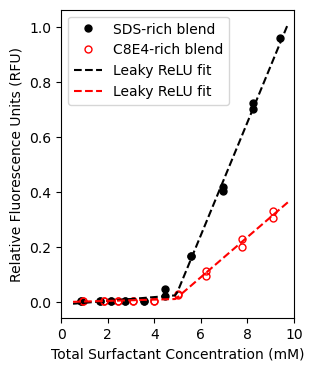

In [39]:
# blends: 6.013, 2.325, 1.192, 0.585, 0.241

blend_data1  = microplate_table[microplate_table["type"] == "0.241"]
X1           = blend_data1["sds_concentration"] + blend_data1["c8e4_concentration"]
Y1           = blend_data1["normalized_fluorescence"]

blend_data2  = microplate_table[microplate_table["type"] == "6.013"]
X2           = blend_data2["sds_concentration"] + blend_data2["c8e4_concentration"]
Y2           = blend_data2["normalized_fluorescence"]

plt.plot(X1, Y1, ".", color="black", markersize=10)
plt.plot(X2, Y2, ".", color="red", markersize=10, fillstyle="none")

XS = np.linspace(0.5, 9.75, 100)
plt.plot(XS, model(XS, *param_list[-1]), "--", color="black", markersize=10, )
plt.plot(XS, model(XS, *param_list[0]), "--", color="red", markersize=10, )

plt.xlim(0.0, 10.0)
plt.xlabel("Total Surfactant Concentration (mM)")
plt.ylabel("Relative Fluorescence Units (RFU)")

plt.legend(["SDS-rich blend", "C8E4-rich blend", "Leaky ReLU fit", "Leaky ReLU fit"], loc="best")

plt.gcf().set_size_inches(W-1, H-2)
plt.savefig("../figures/fig-leaky.png", dpi=300)

plt.show()

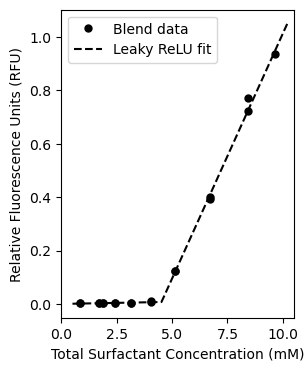

In [40]:
# blends: 6.013, 2.325, 1.192, 0.585, 0.241

blend_data1  = microplate_table[microplate_table["type"] == "0.585"]
X1           = blend_data1["sds_concentration"] + blend_data1["c8e4_concentration"]
Y1           = blend_data1["normalized_fluorescence"]

plt.plot(X1, Y1, ".", color="black", markersize=10)

XS = np.linspace(0.5, 10.20, 100)
plt.plot(XS, model(XS, *param_list[3]), "--", color="black", markersize=10, )

plt.xlim(0.0, 10.5)
plt.xlabel("Total Surfactant Concentration (mM)")
plt.ylabel("Relative Fluorescence Units (RFU)")

plt.legend(["Blend data", "Leaky ReLU fit"], loc="best")

plt.gcf().set_size_inches(W-1, H-2)

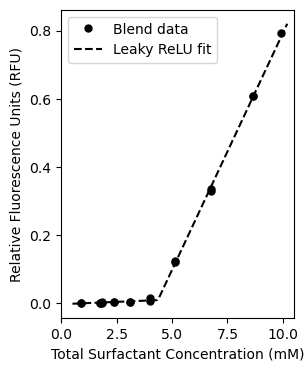

In [41]:
# blends: 6.013, 2.325, 1.192, 0.585, 0.241

blend_data1  = microplate_table[microplate_table["type"] == "1.192"]
X1           = blend_data1["sds_concentration"] + blend_data1["c8e4_concentration"]
Y1           = blend_data1["normalized_fluorescence"]

plt.plot(X1, Y1, ".", color="black", markersize=10)

XS = np.linspace(0.5, 10.20, 100)
plt.plot(XS, model(XS, *param_list[2]), "--", color="black", markersize=10, )

plt.xlim(0.0, 10.5)
plt.xlabel("Total Surfactant Concentration (mM)")
plt.ylabel("Relative Fluorescence Units (RFU)")

plt.legend(["Blend data", "Leaky ReLU fit"], loc="best")

plt.gcf().set_size_inches(W-1, H-2)

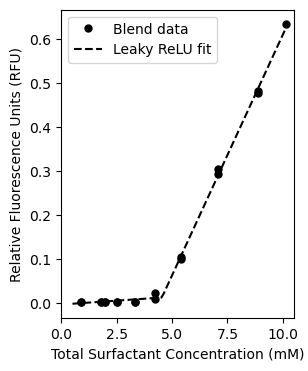

In [42]:
# blends: 6.013, 2.325, 1.192, 0.585, 0.241

blend_data1  = microplate_table[microplate_table["type"] == "2.325"]
X1           = blend_data1["sds_concentration"] + blend_data1["c8e4_concentration"]
Y1           = blend_data1["normalized_fluorescence"]

plt.plot(X1, Y1, ".", color="black", markersize=10)

XS = np.linspace(0.5, 10.20, 100)
plt.plot(XS, model(XS, *param_list[1]), "--", color="black", markersize=10, )

plt.xlim(0.0, 10.5)
plt.xlabel("Total Surfactant Concentration (mM)")
plt.ylabel("Relative Fluorescence Units (RFU)")

plt.legend(["Blend data", "Leaky ReLU fit"], loc="best")

plt.gcf().set_size_inches(W-1, H-2)

## ReLU Orthogonal Regression

In [43]:
''' getting only the constant composition ray lines '''
relu_sds_pts = [relu_results[key][0] for key in relu_results.keys()]
relu_c8e4_pts = [relu_results[key][1] for key in relu_results.keys()]

fig = GO.Figure()

fig.add_trace(GO.Scatter(x=relu_sds_pts, y=relu_c8e4_pts, mode="markers",
    name="ReLU-Fit CMCs", line=dict(color="black"), showlegend=True))

fig.add_trace(GO.Scatter(x=[cmc_1], y=[0], mode="markers", name="SDS CMC",
    line=dict(color="red"), showlegend=False))

fig.add_trace(GO.Scatter(x=[0], y=[cmc_2], mode="markers", name="C8E4 CMC",
    line=dict(color="red"), showlegend=False))

fig.update_layout(
    title_text="ReLU-Predicted CMCs on Experimental Data",
    xaxis_title="SDS Concentration (mM)",
    yaxis_title="C8E4 Concentration (mM)",
    font=dict(family = "Times", size=16),
    showlegend=True)

fig.show()

In [44]:
def nonideal_solution_theory_model(params, sds_pts):
  beta = params[0]
  x_1 = sds_pts / (sds_pts + np.array(relu_c8e4_pts))

  results = []
  for v in x_1:
    curr_solutions = []
    # iterating thru potiential initial guesses to support fsolve convergence
    for mixed_cmc_guess in np.linspace(5, 95, 10):
      for x_1M_guess in np.linspace(0.15, 0.85, 10):
        x_1M, mixed_cmc = fsolve(nonideal_solution_theory,
            [x_1M_guess, mixed_cmc_guess], args=[beta, v, cmc_1, cmc_2])

        # need to verify fsolve solution
        if (cmc_relation(beta, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8
            and beta_relation(v, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8):
          curr_solutions.append((1 - v) * mixed_cmc)

    results.append(curr_solutions[0])

  return np.array(results)

''' creating ODR model for fitting '''
regressor_function = Model(nonideal_solution_theory_model)

''' creating RealData object from ReLU estimated mixed CMC points '''
data = RealData(relu_sds_pts, relu_c8e4_pts)

''' setting up the regressor with the model, data, and initial guesses '''

regressor = ODR(data, regressor_function, beta0=[initial_beta_guess])

solution = regressor.run()

solution.pprint()

Beta: [-2.8454608]
Beta Std Error: [0.09167533]
Beta Covariance: [[1.04917111]]
Residual Variance: 0.00801048230981904
Inverse Condition #: 1.0
Reason(s) for Halting:
  Sum of squares convergence


In [45]:
relu_beta = solution.beta[0]
relu_se = 2 * solution.sd_beta[0]

fig = GO.Figure()

regressed_relu_points = {}
beta_sampling = [relu_beta - relu_se, relu_beta, relu_beta + relu_se]
# looping through potiential interaction parameters
for beta in np.round(beta_sampling, 3):
  curr_beta_curve = []
  # looping through bulk solution surfactant mole fractions
  for x_1 in np.linspace(0.0005, 0.9995, 100):
    curr_solutions = []
    # iterating thru potiential initial guesses to support fsolve convergence
    for mixed_cmc_guess in np.linspace(5, 95, 10):
      for x_1M_guess in np.linspace(0.15, 0.85, 10):
        x_1M, mixed_cmc = fsolve(nonideal_solution_theory,
              [x_1M_guess, mixed_cmc_guess], args=[beta, x_1, cmc_1, cmc_2])

        # need to verify fsolve solution
        if (cmc_relation(beta, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8
          and beta_relation(x_1, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8):
          curr_solutions.append(mixed_cmc)

    try:
      curr_beta_curve.append((x_1 * curr_solutions[0], (1 - x_1) * curr_solutions[0]))
    except IndexError: pass

  regressed_relu_points[beta] = curr_beta_curve

''' now filtering and plotting the individual estimated beta curves '''

for beta_trial in regressed_relu_points:
  # filtering any fsolve extraneous solutions (bounding the zero interaction curve)
  regressed_relu_points[beta_trial] = [(x, y)
    for x, y in regressed_relu_points[beta_trial] if y <= zero_interaction_line(x, cmc_1, cmc_2)]

  # plotting the nonideal solution theory estimated mixed cmc results
  trial_name = "β = " + str(beta_trial)
  fig.add_trace(GO.Scatter(x=[x for x, _ in regressed_relu_points[beta_trial]],
      y=[y for _, y in regressed_relu_points[beta_trial]],
      mode="lines+markers", name=trial_name))


fig.add_trace(GO.Scatter(x=relu_sds_pts, y=relu_c8e4_pts, mode="markers",
    name="ReLU-Fit CMCs", line=dict(color="black"), showlegend=True))

fig.add_trace(GO.Scatter(x=[cmc_1], y=[0], mode="markers", name="SDS CMC",
    line=dict(color="blue"), showlegend=False))

fig.add_trace(GO.Scatter(x=[0], y=[cmc_2], mode="markers", name="C8E4 CMC",
    line=dict(color="blue"), showlegend=False))

fig.update_layout(
    title_text="ReLU-Predicted NST Regressed Curve with 95% Confidence Interval",
    xaxis_title="SDS Concentration (mM)",
    yaxis_title="C8E4 Concentration (mM)",
    font=dict(family = "Times", size=16),
    showlegend=True)

fig.show()

## ReLU Analysis Figures

In [46]:
keys = list(regressed_relu_points.keys())

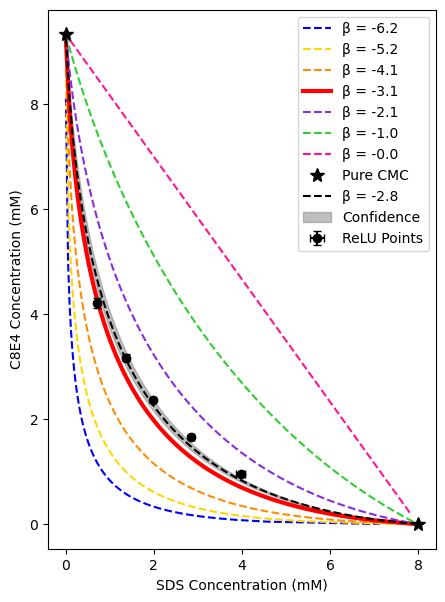

In [47]:
fig, ax = plt.subplots()

colors = ["red", "darkorange", "gold", "limegreen", "blue", "blueviolet", "deeppink"]
shuffle(colors)

for i, beta_trial in enumerate(points):
  # filtering any fsolve extraneous solutions (bounding the zero interaction curve)
  points[beta_trial] = [(x, y) for x, y in points[beta_trial] if y <= zero_interaction_line(x, cmc_1, cmc_2)]

  # plotting the nonideal solution theory estimated mixed cmc results
  trial_name = "β = " + str(beta_trial)

  if beta_trial == -3.1:
    plt.plot([x for x, _ in points[beta_trial]], [y for _, y in points[beta_trial]],
             color=colors[i], linewidth=3)

  else:
    plt.plot([x for x, _ in points[beta_trial]], [y for _, y in points[beta_trial]],
             color=colors[i], linestyle="dashed", )

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

''' plotting ReLU beta curve'''
# filtering any fsolve extraneous solutions (bounding the zero interaction curve)
regressed_relu_points[keys[1]] = \
    [(x, y) for x, y in regressed_relu_points[keys[1]] if y <= zero_interaction_line(x, cmc_1, cmc_2)]

# plotting the nonideal solution theory estimated mixed cmc results
trial_name = "β = " + str(np.round(keys[1], 1))
plt.plot([x for x, _ in regressed_relu_points[keys[1]]],
    [y for _, y in regressed_relu_points[keys[1]]],
    "--", color="black", markersize=10)

''' plotting ReLU LB and UB beta curves '''
# filtering any fsolve extraneous solutions (bounding the zero interaction curve)
regressed_relu_points[keys[2]] = \
    [(x, y) for x, y in regressed_relu_points[keys[2]] if y <= zero_interaction_line(x, cmc_1, cmc_2)]

# filtering any fsolve extraneous solutions (bounding the zero interaction curve)
regressed_relu_points[keys[0]] = \
    [(x, y) for x, y in regressed_relu_points[keys[0]] if y <= zero_interaction_line(x, cmc_1, cmc_2)]

ax.fill_between([x for x, _ in regressed_relu_points[keys[1]]],
                [y for _, y in regressed_relu_points[keys[0]]],
                [y for _, y in regressed_relu_points[keys[2]]],
                color="gray", alpha=0.5)

# adding the ReLU-determined CMCs from before
for _ in range(len(rounded_compositions)):
  X = [relu_results[rounded_compositions[_]][0]]
  Y = [relu_results[rounded_compositions[_]][1]]

  ax.errorbar(X, Y, xerr=[relu_errors[_][0]], yerr=[relu_errors[_][1]],
              color="black", ecolor="black", fmt="o", capsize=3)

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")

ax.set_xticks(np.arange(0, 10, 2,))
ax.set_yticks(np.arange(0, 10, 2,))

plt.legend(["β = -6.2", "β = -5.2", "β = -4.1", "β = -3.1", "β = -2.1", "β = -1.0", "β = -0.0",
            "Pure CMC", trial_name, "Confidence", "ReLU Points"])

plt.gcf().set_size_inches(W+1, H+1)
plt.savefig("../figures/fig-rst-mixed.png", bbox_inches="tight", dpi=300)

# Plane-Fitting

In [48]:
''' equation of plane for "blank region", args as [x, y] '''
def equation_plane(args, a, b, c): return a * args[0] + b * args[1] + c

In [49]:
high_point = 2
x = analysis_table[analysis_table["trial_number"] <= high_point]["sds_concentration"]
y = analysis_table[analysis_table["trial_number"] <= high_point]["c8e4_concentration"]
z = analysis_table[analysis_table["trial_number"] <= high_point]["normalized_fluorescence"]

# bounding by the 95% confidence interval
p, pint, se = nlinfit(equation_plane, [x, y], z, [0.005, 0.005, 0.005], alpha=0.05)

X, Y = [], []
grid_points = 50
for v1 in np.linspace(0, cmc_1/2, grid_points):
  for v2 in np.linspace(0, cmc_2/2, grid_points):
    X.append(v1); Y.append(v2)

In [50]:
fig = GO.Figure()

_ = 12
x = analysis_table[analysis_table["trial_number"] < _]["sds_concentration"]
y = analysis_table[analysis_table["trial_number"] < _]["c8e4_concentration"]
z = analysis_table[analysis_table["trial_number"] < _]["normalized_fluorescence"]

fig.add_trace(GO.Scatter3d(x=x, y=y, z=z, mode="markers",
    marker=dict(size=8, color=analysis_table[analysis_table["trial_number"] < _]["normalized_fluorescence"],
    cmax=max(analysis_table[analysis_table["trial_number"] < _]["normalized_fluorescence"]), cmin=0,
    colorscale="turbo")))

Z = equation_plane([np.array(X), np.array(Y)], p[0], p[1], p[2])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z, mode="lines", line=dict(color="blue")))

Z_L = equation_plane([np.array(X), np.array(Y)], pint[0][0], pint[1][0], pint[2][0])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z_L, mode="lines", line=dict(color="red")))

Z_U = equation_plane([np.array(X), np.array(Y)], pint[0][1], pint[1][1], pint[2][1])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z_U, mode="lines", line=dict(color="red")))

xe, ye, ze = rotate_z(1, 2, 0.5, -1 * np.pi)          # 12 pts
# xe, ye, ze = rotate_z(1, 2, 0.25, -1 * (4/6) * np.pi)   # 6 pts

fig.update_layout(scene=dict(
    xaxis_title="SDS (mM)",
    yaxis_title="C8E4 (mM)",
    zaxis_title="RFU"),
    scene_camera_eye=dict(x=xe, y=ye, z=ze),
    margin=dict(l=0, r=0, t=0, b=0),
    showlegend=False)

fig.show()

fig.write_image("../figures/fig-plane-a" + ".png", engine="kaleido", width=600, height=400, scale=2.0)

In [51]:
fig = GO.Figure()

_ = 6
x = analysis_table[analysis_table["trial_number"] < _]["sds_concentration"]
y = analysis_table[analysis_table["trial_number"] < _]["c8e4_concentration"]
z = analysis_table[analysis_table["trial_number"] < _]["normalized_fluorescence"]

fig.add_trace(GO.Scatter3d(x=x, y=y, z=z, mode="markers",
    marker=dict(size=8, color=analysis_table[analysis_table["trial_number"] < _]["normalized_fluorescence"],
    cmax=max(analysis_table[analysis_table["trial_number"] < _]["normalized_fluorescence"]), cmin=0,
    colorscale=[[0, "black"], [1, "navy"]])))

Z = equation_plane([np.array(X), np.array(Y)], p[0], p[1], p[2])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z, mode="lines", line=dict(color="blue")))

Z_L = equation_plane([np.array(X), np.array(Y)], pint[0][0], pint[1][0], pint[2][0])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z_L, mode="lines", line=dict(color="red")))

Z_U = equation_plane([np.array(X), np.array(Y)], pint[0][1], pint[1][1], pint[2][1])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z_U, mode="lines", line=dict(color="red")))

# xe, ye, ze = rotate_z(1, 2, 0.5, -1 * np.pi)          # 12 pts
xe, ye, ze = rotate_z(1, 2, 0.25, -1 * (4/6) * np.pi)   # 6 pts

fig.update_layout(scene=dict(
    xaxis_title="SDS (mM)",
    yaxis_title="C8E4 (mM)",
    zaxis_title="RFU"),
    scene_camera_eye=dict(x=xe, y=ye, z=ze),
    margin=dict(l=0, r=0, t=0, b=0),
    showlegend=False)

fig.show()

fig.write_image("../figures/fig-plane-b" + ".png", engine="kaleido", width=600, height=400, scale=2.0)

In [52]:
X = np.array(analysis_table["sds_concentration"])
Y = np.array(analysis_table["c8e4_concentration"])
Z = np.array(analysis_table["normalized_fluorescence"])
type_label = np.array(analysis_table["type"])

a, b, c = pint[0][1], pint[1][1], pint[2][1]

labels = []
for i in range(len(analysis_table)):
  x, y, z = X[i], Y[i], Z[i]

  z_pred = equation_plane([x, y], a, b, c)

  if (z >= z_pred): labels.append(int(1))
  else: labels.append(int(0))

classification_table = pd.DataFrame()
classification_table["sds_concentration"] = X
classification_table["c8e4_concentration"] = Y
classification_table["labels"] = labels
classification_table["type"] = type_label

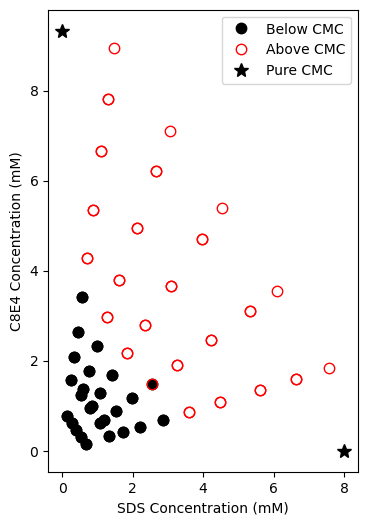

In [53]:
fig, ax = plt.subplots()

reds    = classification_table[classification_table["labels"] == 1]
blacks  = classification_table[classification_table["labels"] == 0]

plt.plot(blacks["sds_concentration"], blacks["c8e4_concentration"], ".", color="black", fillstyle="full", markersize=15)
plt.plot(reds["sds_concentration"], reds["c8e4_concentration"], ".", color="red", fillstyle="none", markersize=15)

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")

ax.set_xticks(np.arange(0, 10, 2,))
ax.set_yticks(np.arange(0, 10, 2,))

plt.legend(["Below CMC", "Above CMC", "Pure CMC"], loc="best")

plt.gcf().set_size_inches(W, H)

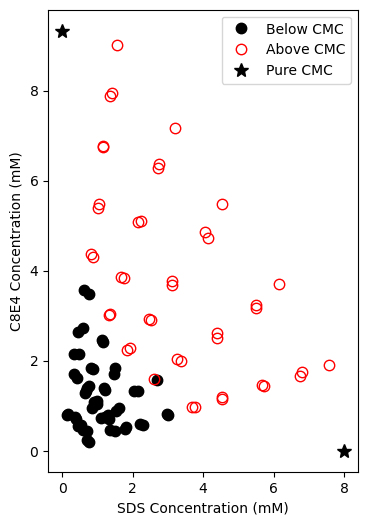

In [54]:
fig, ax = plt.subplots()

reds    = classification_table[classification_table["labels"] == 1]
blacks  = classification_table[classification_table["labels"] == 0]

# setting jitter factors
j_x = 1.5 / cmc_1
j_y = 1.5 / cmc_2

plt.plot(blacks["sds_concentration"] + j_x * np.random.uniform(size=blacks["sds_concentration"].shape),
         blacks["c8e4_concentration"] + j_y * np.random.uniform(size=blacks["c8e4_concentration"].shape),
         ".", color="black", fillstyle="full", markersize=15)

plt.plot(reds["sds_concentration"] + j_x * np.random.uniform(size=reds["sds_concentration"].shape),
         reds["c8e4_concentration"] + j_y * np.random.uniform(size=reds["c8e4_concentration"].shape),
         ".", color="red", fillstyle="none", markersize=15)

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")

ax.set_xticks(np.arange(0, 10, 2,))
ax.set_yticks(np.arange(0, 10, 2,))

plt.legend(["Below CMC", "Above CMC", "Pure CMC"], loc="best")

plt.gcf().set_size_inches(W, H)

# Physics-Based Analysis

## Physics Modeling

In [55]:
''' physics-based classification model '''
def nst_classification_model(params, args):
  beta = params
  cmc_1, cmc_2, X, Y = args

  classification_predictions = []
  ''' creating the nonideal solution theory curve from given params '''
  results_x, results_y = [], []
  for x_1 in np.linspace(0.005, 0.9995, 50):
    curr_solutions = []
    # iterating thru potiential initial guesses to support fsolve convergence
    for mixed_cmc_guess in np.linspace(5, 95, 10):
      for x_1M_guess in np.linspace(0.15, 0.85, 10):
        x_1M, mixed_cmc = fsolve(nonideal_solution_theory,
            [x_1M_guess, mixed_cmc_guess], args=[beta, x_1, cmc_1, cmc_2])

        # verifying fsolve solution
        if (cmc_relation(beta, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8
            and beta_relation(x_1, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8):
          curr_solutions.append(mixed_cmc)

    # filtering out any extraneous solutions
    x, y = x_1 * curr_solutions[0], (1 - x_1) * curr_solutions[0]
    if y < zero_interaction_line(x, cmc_1, cmc_2):
      results_x.append(x)
      results_y.append(y)

  # approximating nonideal solution theory curve as polynomial
  f = interpolate.interp1d(results_x, results_y, kind="cubic")

  ''' labeling each x ∈ X as {0, 1} based on position relative to NST curve '''
  for i in range(len(X)):
    x, y = X[i], Y[i]
    unit_vector_slope = y / x

    # getting intersection between x value vector from (0, 0) and NST curve
    def intersection(x): return f(x) - unit_vector_slope * x
    solution = fsolve(intersection, x0=x)

    intersection_x, intersection_y = solution[0], unit_vector_slope * solution[0]

    # classifing each x as 0 or 1 based on orthogonal intersection point
    if x < intersection_x or y < intersection_y:
      classification_predictions.append(int(0))
    else:
      classification_predictions.append(int(1))

  return classification_predictions

In [56]:
''' cross entropy (log) loss for binary classification '''
def log_loss(y_pred, y_true):
  errors = (y_true * np.log10(y_pred + 1E-8)) + ((1 - y_true) * np.log10(1 - y_pred + 1E-8))
  loss = (-1 / (len(y_pred))) * np.sum(errors)
  return loss

In [57]:
''' physics-based classification objective function '''
def nst_classification_objective(params, args):
  y_pred = np.array(nst_classification_model(params, args))
  y_true = np.array(classification_table["labels"])

  return log_loss(y_pred, y_true)

In [58]:
X = classification_table["sds_concentration"].tolist()
Y = classification_table["c8e4_concentration"].tolist()

beta_guess = initial_beta_guess
beta_range = np.linspace(1.55 * beta_guess, 0, 25)

L = [nst_classification_objective(_, [cmc_1, cmc_2, X, Y]) for _ in beta_range]

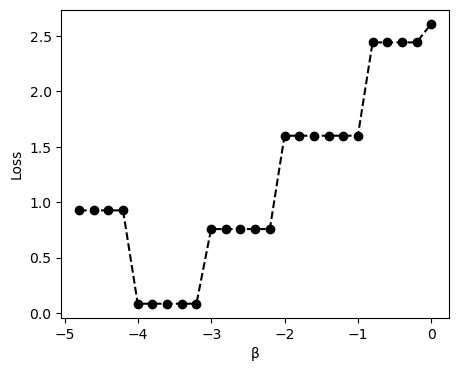

In [59]:
plt.plot(beta_range, L, linestyle="--", marker="o", color="black",)

plt.xlabel("β")
plt.ylabel("Loss")

plt.gcf().set_size_inches(W+1, H-2)

## Physics-Based Plots

In [60]:
physics_beta_UB = -3.10
physics_beta_LB = -4.06

regressed_physics_points = {}
beta_sampling = [physics_beta_UB, physics_beta_LB]
# looping through potiential interaction parameters
for beta in np.round(beta_sampling, 3):
  curr_beta_curve = []
  # looping through bulk solution surfactant mole fractions
  for x_1 in np.linspace(0.0005, 0.9995, 100):
    curr_solutions = []
    # iterating thru potiential initial guesses to support fsolve convergence
    for mixed_cmc_guess in np.linspace(5, 95, 10):
      for x_1M_guess in np.linspace(0.15, 0.85, 10):
        x_1M, mixed_cmc = fsolve(nonideal_solution_theory,
              [x_1M_guess, mixed_cmc_guess], args=[beta, x_1, cmc_1, cmc_2])

        # need to verify fsolve solution
        if (cmc_relation(beta, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8
          and beta_relation(x_1, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8):
          curr_solutions.append(mixed_cmc)

    try:
      curr_beta_curve.append((x_1 * curr_solutions[0], (1 - x_1) * curr_solutions[0]))
    except IndexError: pass

  regressed_physics_points[beta] = curr_beta_curve

keys = list(regressed_physics_points.keys())

f_U = interpolate.interp1d(
    [x for x, _ in regressed_physics_points[keys[0]]],
    [y for _, y in regressed_physics_points[keys[0]]],
    kind="cubic", fill_value="extrapolate")
f_L = interpolate.interp1d(
    [x for x, _ in regressed_physics_points[keys[1]]],
    [y for _, y in regressed_physics_points[keys[1]]],
    kind="cubic", fill_value="extrapolate")

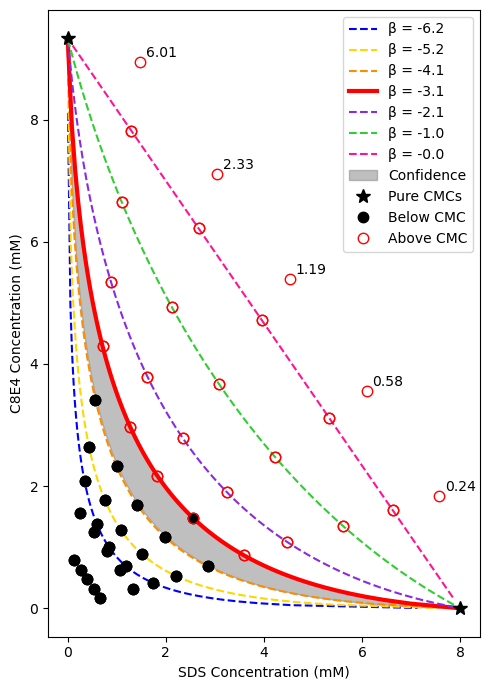

In [61]:
fig, ax = plt.subplots()

colors = ["red", "darkorange", "gold", "limegreen", "blue", "blueviolet", "deeppink"]
shuffle(colors)

for i, beta_trial in enumerate(points):
  # filtering any fsolve extraneous solutions (bounding the zero interaction curve)
  points[beta_trial] = [(x, y) for x, y in points[beta_trial] if y <= zero_interaction_line(x, cmc_1, cmc_2)]

  # plotting the nonideal solution theory estimated mixed cmc results
  trial_name = "β = " + str(beta_trial)

  if beta_trial == -3.1:
    plt.plot([x for x, _ in points[beta_trial]], [y for _, y in points[beta_trial]],
             color=colors[i], linewidth=3)
  else:
    plt.plot([x for x, _ in points[beta_trial]], [y for _, y in points[beta_trial]],
             color=colors[i], linestyle="dashed", )


''' plotting LB and UB beta curves '''
X = np.linspace(0, cmc_1, 100)
ax.fill_between(X, f_U(X), f_L(X), color="gray", alpha=0.5)

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

# adding classification-labeled data
reds    = classification_table[classification_table["labels"] == 1]
blacks  = classification_table[classification_table["labels"] == 0]
plt.plot(blacks["sds_concentration"], blacks["c8e4_concentration"], ".", color="black", fillstyle="full", markersize=15)
plt.plot(reds["sds_concentration"], reds["c8e4_concentration"], ".", color="red", fillstyle="none", markersize=15)

# adding annotation for ray line blend ratio
for chi in set(classification_table["type"]): # looping over the five ray lines
  chi_table = classification_table[classification_table["type"] == chi].sort_values(
      by="sds_concentration", ascending=False)

  plt.annotate(
      f"{np.round(float(chi), 2)}", # ray line blend ratio
      xy=(chi_table.iloc[0]["sds_concentration"], chi_table.iloc[0]["c8e4_concentration"]),
      xytext=(4, 4),                # distance from the point, in points
      textcoords="offset points",   # interpreting text position as offset in points from annotated point
      ha="left",                    # horizontal alignment
      va="baseline"                 # vertical alignment
  )


plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")

ax.set_xticks(np.arange(0, 10, 2,))
ax.set_yticks(np.arange(0, 10, 2,))

plt.legend(["β = -6.2", "β = -5.2", "β = -4.1", "β = -3.1", "β = -2.1", "β = -1.0", "β = -0.0",
            "Confidence", "Pure CMCs", "Below CMC", "Above CMC"])

plt.gcf().set_size_inches(W+1, H+1)
plt.tight_layout()
plt.savefig("../figures/fig-bin-electrolyte", dpi=300)

# Methodology Verification



In [62]:
# deleting all local variables in order to setup NaCl experiment
%reset -f

## Libraries

In [63]:
import random
import numpy as np
import pandas as pd

from scipy.odr import *
from pycse import nlinfit

from scipy import interpolate
from scipy.optimize import fsolve

import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as GO
from plotly.subplots import make_subplots

## Plot Configurations

In [64]:
''' specifying matplotlib figure dimensions '''
W, H = 4, 6

## Design Utilities

In [65]:
def cmc_relation(beta, x_1M, cmc_1, cmc_2, cmc_mixed):
  f_1, f_2 = np.exp(beta * (x_1M)**2), np.exp(beta * (1 - x_1M)**2)
  return x_1M * cmc_1 * f_2 + (1 - x_1M) * cmc_2 * f_1 - cmc_mixed

def beta_relation(x_1, x_1M, cmc_1, cmc_2, cmc_mixed):
  beta_equn_term_1 = x_1M**2 * np.log((x_1 * cmc_mixed) / (x_1M * cmc_1))
  beta_equn_term_2 = (1 - x_1M)**2 * np.log(((1 - x_1) * cmc_mixed) / ((1 - x_1M) * cmc_2))
  return beta_equn_term_1 - beta_equn_term_2

def nonideal_solution_theory(params, args):
  x_1M, cmc_mixed = params
  beta, x_1, cmc_1, cmc_2 = args
  return [cmc_relation(beta, x_1M, cmc_1, cmc_2, cmc_mixed),
          beta_relation(x_1, x_1M, cmc_1, cmc_2, cmc_mixed)]

''' @brief calculates the cartesian distance between (x1, y1) and (x2, y2) '''
def distance_formula(x1, y1, x2, y2): return np.sqrt((x2-x1)**2 + (y2-y1)**2)

''' @brief maps the zero-interaction line between the two pure cmcs '''
def zero_interaction_line(x, cmc_1, cmc_2): return (-1 * cmc_2 / cmc_1) * (x - cmc_1)

''' @brief randomly shuffles list L (given seed value) '''
def shuffle(L): return random.Random(0).shuffle(L)

In [66]:
''' @brief finds the most frequent number from a list of values '''
def find_frequent_number(lst): return max(set(lst), key=lst.count)

''' @brief implicitly solves non-ideal solution theory over several initial
      guesses and returns an interpolated polynomial of the converged solution

    @param[in] cmc_1 pure cmc corresponding to the x-axis
    @param[in] cmc_2 pure cmc corresponding to the y-axis
    @param[in] beta the interaction parameter
    @param[in] n_points number of bulk mole fraction points to iterate through

    @return f cubic interpolated polynomial on the implicit solution curve
'''
def implicit_solve_interpolate_nst(cmc_1, cmc_2, beta, n_pts=50):
  beta_curve = []

  # looping through bulk solution surfactant mole fractions
  for x_1 in np.linspace(0.0005, 0.9995, n_pts):

    curr_pt_solutions = []
    # iterating thru potiential initial guesses to support fsolve convergence
    for mixed_cmc_guess in np.linspace(5, 95, 10):
      for x_1M_guess in np.linspace(0.15, 0.85, 10):

        x_1M, mixed_cmc = fsolve(nonideal_solution_theory,
              [x_1M_guess, mixed_cmc_guess], args=[beta, x_1, cmc_1, cmc_2])

        # verifying fsolve solution
        if (cmc_relation(beta, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8
          and beta_relation(x_1, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8):
          curr_pt_solutions.append(mixed_cmc)

    try:
      # using find_frequent_number to select the most frequent fsolve solution
      solved_pt = find_frequent_number(list(np.round(curr_pt_solutions, 5)))

      # filtering out extraneous, feasible solutions (above the zero-interaction line)
      x, y = x_1 * solved_pt, (1 - x_1) * solved_pt
      if (y <= zero_interaction_line(x, cmc_1, cmc_2)): beta_curve.append((x, y))

    except: continue

  # adding end padding to ensure cubic fit follows non-ideal solution theory
  end_x = beta_curve[-1][0]
  beta_curve += [(end_x + i, 0) for i in range(1, 5)]

  # interpolating the implicitly solved curve (and extrapolating edges)
  xs, ys = np.transpose(beta_curve)
  f = interpolate.interp1d(xs, ys, kind="cubic", fill_value="extrapolate")

  return f

In [67]:
''' @brief implicitly solves non-ideal solution theory over several initial
      guesses and returns the corresponding y-coordinate values

    @NOTE: this function is used for orthogonal regression

    @param[in] params the beta interaction parameter
    @param[in] args (X, Y) the points of (surfactant #1, surfactant #2) in mM

    @NOTE: X, Y must be numpy 1D arrays

    @return a Y array (surfactant #2 concentrations) with same shape as the X array
'''
def implicit_solve_regress_nst(params, args):
  beta = params[0]
  X, Y = args
  x1_range = X / (X + Y)

  results = []
  for x_1 in x1_range:    # looping through bulk solution mole fractions

    curr_pt_solutions = []
    # iterating thru potiential initial guesses to support fsolve convergence
    for mixed_cmc_guess in np.linspace(5, 95, 10):
      for x_1M_guess in np.linspace(0.15, 0.85, 10):

        x_1M, mixed_cmc = fsolve(nonideal_solution_theory,
              [x_1M_guess, mixed_cmc_guess], args=[beta, x_1, cmc_1, cmc_2])

        # verifying fsolve solution
        if (cmc_relation(beta, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8
          and beta_relation(x_1, x_1M, cmc_1, cmc_2, mixed_cmc) < 1E-8):
          curr_pt_solutions.append((1 - x_1) * mixed_cmc)   # adding y coordinate

    try:
      # using find_frequent_number to select the most frequent fsolve solution
      converged_y = find_frequent_number(list(np.round(curr_pt_solutions, 12)))

      results.append(converged_y)

    except: results.append(curr_pt_solutions[0])

  return np.array(results)

## Design Setup

In [68]:
cmc_1, cmc_2 = 0.56, 6.99   # mM
initial_beta_guess = -2.6   # literature-value

fig = GO.Figure()

beta_function_mapping = {}
beta_sampling = np.linspace(2 * initial_beta_guess, 0, 7)

# looping through potiential interaction parameters
for beta in np.round(beta_sampling, 1):
  f = implicit_solve_interpolate_nst(cmc_1, cmc_2, beta)

  beta_function_mapping[beta] = f

  x_range = np.linspace(0, cmc_1, 100)
  y_range = f(x_range)
  # plotting the nonideal solution theory estimated mixed cmc results
  trial_name = "β = " + str(beta)
  fig.add_trace(GO.Scatter(x=x_range, y=y_range,
      mode="lines+markers", name=trial_name))

fig.update_layout(
    title="Nonideal Solution Theory Binary Map",
    xaxis_title="SDS Concentration (mM)",    # surfactant 1
    yaxis_title="C8E4 Concentration (mM)",   # surfactant 2
    font=dict(family = "Times", size=16))

fig.show()

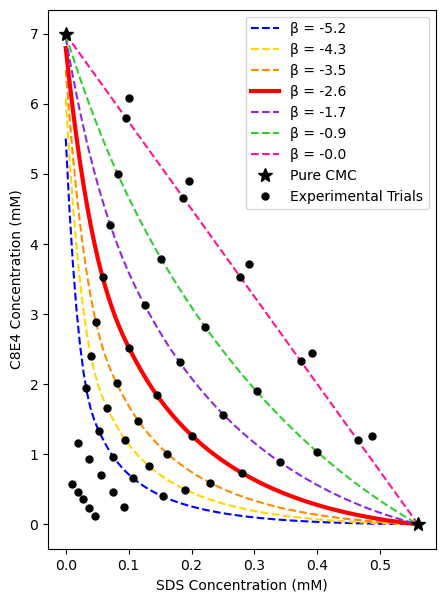

In [69]:
''' generating constant-composition evenly-spaced ray lines '''
n_rays = 5

z = distance_formula(cmc_1, 0, 0, cmc_2)    # distance between two pure CMCs
section_length = z / (n_rays + 1)

# moving along the zero-interaction line to find the evenly-spaced points
compositions = []
for i in range(1, n_rays + 1):
  x_i, y_i = 0, 0
  arbitrary_min_dist = 100.0
  curr_distance = i * section_length

  for v_x in np.linspace(0, cmc_1, 100):
    v_y = zero_interaction_line(v_x, cmc_1, cmc_2)

    z_i = np.abs(distance_formula(0, cmc_2, v_x, v_y) - curr_distance)

    if z_i < arbitrary_min_dist:
      arbitrary_min_dist = z_i
      x_i, y_i = v_x, v_y

  ray_line_slope = y_i / x_i
  compositions.append(ray_line_slope)

''' generating trials at intersections between the ray lines and beta curves '''
trials = {}
for chi in compositions:
  curr_trials = []
  for beta in beta_function_mapping:
    f = beta_function_mapping[beta]
    def intersection(x): return f(x) - chi * x

    sol = fsolve(intersection, x0=0)

    # bounding the approximate intersection solution
    if (intersection(sol) < 1E-8): curr_trials.append((sol[0], chi * sol[0]))

  trials[chi] = curr_trials

''' plotting the model-driven ray-line design '''

colors = ["red", "darkorange", "gold", "limegreen", "blue", "blueviolet", "deeppink"]
shuffle(colors)

# plotting nonideal solution theory estimated cmc curves
for i, beta in enumerate(beta_function_mapping):
  trial_name = "β = " + str(beta)

  f     = beta_function_mapping[beta]
  xs    = np.linspace(0, cmc_1, 100)
  ys    = f(xs)

  if (beta == -2.6): plt.plot(xs, ys, color=colors[i], linewidth=3, label=trial_name)
  else: plt.plot(xs, ys, color=colors[i], linestyle="dashed", label=trial_name)

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

# plotting model-driven trial points
for chi in trials:
  tuple_xs, tuple_ys = zip(*trials[chi])
  xs = list(tuple_xs)
  ys = list(tuple_ys)

  # adding low-point samples
  blank_region_fractions = [0.2, 0.1]
  zero_interaction_x, zero_interaction_y = xs[-1], ys[-1]
  for v in blank_region_fractions:
    trials[chi].insert(0, (v * zero_interaction_x, v * zero_interaction_y))
    xs.insert(0, v * zero_interaction_x)
    ys.insert(0, v * zero_interaction_y)

  # adding high-point samples
  above_fraction = 1.05
  trials[chi].append((above_fraction * xs[-1], above_fraction * ys[-1]))
  xs.append(above_fraction * xs[-1])
  ys.append(above_fraction * ys[-1])

  # plotting the proposed mixed surfactant trials
  plt.plot(xs, ys, ".", color="black", markersize=10, label="Experimental Trials")

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")
plt.legend(loc="best")

plt.legend(["β = -5.2", "β = -4.3", "β = -3.5", "β = -2.6", "β = -1.7", "β = -0.9", "β = -0.0", "Pure CMC", "Experimental Trials"])

plt.gcf().set_size_inches(W+1, H+1)

### Well-Plate Setup

In [70]:
''' NaCl stock '''
vial_volume = 0.0010        # L
vol_dye_L = 0.020 / 1000    # L

''' NaCl Calculations '''
nacl_stock = 4.030428               # M
desired_nacl_concentration = 0.5    # M
vol_nacl_mL = np.round((desired_nacl_concentration / nacl_stock) * vial_volume * 1000, 3)
print(f"NaCl Stock Volume (mL): {vol_nacl_mL}")

NaCl Stock Volume (mL): 0.124


In [71]:
sds_stock = 3.095360        # mM
c8e4_stock = 7.525845       # mM

desired_stock_volume = 0.025 # L

rounded_compositions = []
mixed_stock_solution_makeup = {}
for chi in compositions:
  sds_volume = desired_stock_volume / (chi * (sds_stock / c8e4_stock) + 1)
  c8e4_volume = desired_stock_volume - sds_volume

  rounded_sds_volume = np.round(sds_volume * 1000, 1)       # rounded in mL
  rounded_c8e4_volume = np.round(c8e4_volume * 1000, 1)     # rounded in mL

  rounded_chi = np.round((rounded_c8e4_volume * c8e4_stock) / (rounded_sds_volume * sds_stock), 3)

  rounded_compositions.append(rounded_chi)
  mixed_stock_solution_makeup[rounded_chi] = (rounded_sds_volume, rounded_c8e4_volume)

# mixed_stock_solution_makeup   # in (SDS mL, C8E4 mL)

In [72]:
mixed_stock_concentrations = []
for chi in mixed_stock_solution_makeup:
  curr_mmol_sds = sds_stock * (mixed_stock_solution_makeup[chi][0] / 1000)
  curr_mmol_c8e4 = c8e4_stock * (mixed_stock_solution_makeup[chi][1] / 1000)

  mixed_stock_concentrations.append((curr_mmol_sds + curr_mmol_c8e4) / desired_stock_volume)

mixed_trial_solution_makeup = {}
for i in range(len(rounded_compositions)): # number of mixed composition ray lines
  curr_chi_volumes = []
  for trial_number in range(10):
    # using the theorized values as basis for volume calculations
    trial_sds_concentration = trials[list(trials.keys())[i]][trial_number][0]
    trial_c8e4_concentration = trials[list(trials.keys())[i]][trial_number][1]

    mixed_trial_concentration = trial_sds_concentration + trial_c8e4_concentration
    mixed_volume = (mixed_trial_concentration * vial_volume) / mixed_stock_concentrations[i]
    fillup_volume = vial_volume - mixed_volume - (vol_nacl_mL / 1000) - vol_dye_L
    rounded_mixed_volume_mL = np.round(mixed_volume * 1000, 3)
    rounded_fillup_volume_mL = np.round(fillup_volume * 1000, 3)
    curr_chi_volumes.append((rounded_mixed_volume_mL, rounded_fillup_volume_mL))

  mixed_trial_solution_makeup[rounded_compositions[i]] = curr_chi_volumes

# mixed_trial_solution_makeup

In [73]:
''' generating plate indicies '''
plate_index_1 = ["A", "B", "C", "D", "E", "F", "G", "H"]
plate_index_2 = [str(i) for i in range(1, 13)]

shuffle(plate_index_1)
shuffle(plate_index_2)

plate_order = [letter + number for letter in plate_index_1 for number in plate_index_2]

''' generating sample labels '''
sample_labels = []

for chi in rounded_compositions:
  for trial in range(10):
    for replicate in range(2):
      if trial == 9 and replicate == 1: continue # skipping top trial replicate sample

      sample_labels.append("NaCl-" + str(chi) + "-" + str(trial + 1) + "-" + str(replicate + 1))

sample_labels.extend(["IFS"])

''' shuffling and tabulating the plate setup '''
shuffle(plate_order)
shuffle(sample_labels)

data_dict = {"index" : plate_order, "sample_id" : sample_labels}
plate_setup = pd.DataFrame(data_dict)

# plate_setup

## Data Preprocessing

In [74]:
''' @brief finds the nearest non-rounded chi from rounded experimental value '''
def find_nearest_chi(X):
  closest_design_chi, min_value = 0, np.inf
  for design_chi in list(trials.keys()):    # finding the current ray line
    curr_proximity = np.abs(design_chi - float(X))
    if (curr_proximity < min_value):
      min_value = curr_proximity
      closest_design_chi = design_chi

  return closest_design_chi

In [75]:
''' unpacks trial labels (from the results_table dataframe),
      according to the specified design above '''
def map_results(results_table):
  ''' expanding the sample_id column to its chi, trial number, and replicate '''
  sample_type, trial_n, replicate_n, sds_concentration, c8e4_concentration, = [], [], [], [], []
  for label in results_table["sample_id"]:
    label_info = label.split("-")

    if label_info[0] == "IFS":
      sample_type.append("IFS")
      trial_n.append(int(0))
      replicate_n.append(int(0))
      sds_concentration.append(int(0))
      c8e4_concentration.append(int(0))

    else:
      sample_type.append(label_info[1])
      trial_n.append(int(label_info[2]))
      replicate_n.append(int(label_info[3]))

      design_chi = find_nearest_chi(label_info[1])
      design_sds_pt, design_c8e4_pt = trials[design_chi][int(label_info[2]) - 1]

      avg_sds_pt = (design_sds_pt + design_c8e4_pt / design_chi) / 2
      avg_c8e4_pt = (design_c8e4_pt + design_chi * design_sds_pt) / 2

      sds_concentration.append(avg_sds_pt)
      c8e4_concentration.append(avg_c8e4_pt)


  ''' aggregating the current measurment sample information '''
  results = results_table.copy()
  results["type"] = sample_type
  results["trial_number"] = trial_n
  results["sds_concentration"] = sds_concentration
  results["c8e4_concentration"] = c8e4_concentration
  results["replicate"] = replicate_n

  return results

''' @brief reads in the raw excel file, matches plate indicies to measured
      fluorescence values, and uses map_results() to unpack trial labels '''
def read_microplate_data(filename, experiment_setup):
  ''' formatting MicroPlate reader data '''
  data_table = pd.read_excel(filename)

  ''' dropping useless first column from dataframes '''
  data_table = data_table.iloc[:, 1:]

  ''' dropping useless last column from results dataframe '''
  data_table = data_table.iloc[:, :-1]

  ''' reindexing the table to match plate indicies '''
  data_table.index = ["A", "B", "C", "D", "E", "F", "G", "H"]

  ''' mapping tabular fluorescence results into reformatted dataframe '''
  results_mapping = []
  for letter_index in data_table.index:
    for number_index in data_table.columns:
      item = (letter_index, str(number_index), data_table[number_index][letter_index])
      results_mapping.append(item)

  fluorescence_table = pd.DataFrame(results_mapping, columns=["row", "column", "fluorescence"])

  ''' reformatting the experiment_setup to match format of fluorescence_table '''
  labels = experiment_setup["sample_id"].tolist()
  indicies = [(plate_index[0], plate_index[1:])for plate_index in experiment_setup["index"].tolist()]
  experiment_design_setup = pd.DataFrame(indicies, columns=["row", "column"])
  experiment_design_setup["sample_id"] = labels

  ''' joining design_table and fluorescence_table '''
  results_table = pd.merge(experiment_design_setup, fluorescence_table,  how='left',
                    left_on=["row", "column"], right_on = ["row", "column"])

  output_table = map_results(results_table)

  return output_table

In [76]:
''' aggregating the clean vial trials'''
measure_1 = read_microplate_data("081723-pseudo-binary-clean-nacl-MP1.xlsx", plate_setup)
measure_2 = read_microplate_data("081723-pseudo-binary-clean-nacl-MP2.xlsx", plate_setup)
measure_3 = read_microplate_data("081723-pseudo-binary-clean-nacl-MP3.xlsx", plate_setup)
measure_4 = read_microplate_data("081723-pseudo-binary-clean-nacl-MP4.xlsx", plate_setup)
measure_5 = read_microplate_data("081723-pseudo-binary-clean-nacl-MP5.xlsx", plate_setup)

salt_trials = pd.DataFrame()

salt_trials["row"] = measure_1["row"]
salt_trials["column"] = measure_1["column"]
salt_trials["sample_id"] = measure_1["sample_id"]

salt_trials["type"] = measure_1["type"]
salt_trials["trial_number"] = measure_1["trial_number"]
salt_trials["replicate"] = measure_1["replicate"]

salt_trials["sds_concentration"] = measure_1["sds_concentration"]
salt_trials["c8e4_concentration"] = measure_1["c8e4_concentration"]

salt_trials["scan-1"] = measure_1["fluorescence"]
salt_trials["scan-2"] = measure_2["fluorescence"]
salt_trials["scan-3"] = measure_3["fluorescence"]
salt_trials["scan-4"] = measure_4["fluorescence"]
salt_trials["scan-5"] = measure_5["fluorescence"]

salt_trials["average_fluorescence"] = np.mean(
    [salt_trials["scan-1"],
     salt_trials["scan-2"],
     salt_trials["scan-3"],
     salt_trials["scan-4"],
     salt_trials["scan-5"]], axis=0)

salt_trials["fluorescence_stdev"] = np.std(
    [salt_trials["scan-1"],
     salt_trials["scan-2"],
     salt_trials["scan-3"],
     salt_trials["scan-4"],
     salt_trials["scan-5"]], axis=0, dtype=np.float64)

''' normalizing by internal fluorescence standard '''
ifs = np.mean(salt_trials[salt_trials["type"] == "IFS"]["average_fluorescence"])
salt_trials.drop(salt_trials[salt_trials["type"] == "IFS"].index, inplace = True)

salt_trials["normalized_fluorescence"] = salt_trials["average_fluorescence"] / ifs

# salt_trials

## Data Visualization

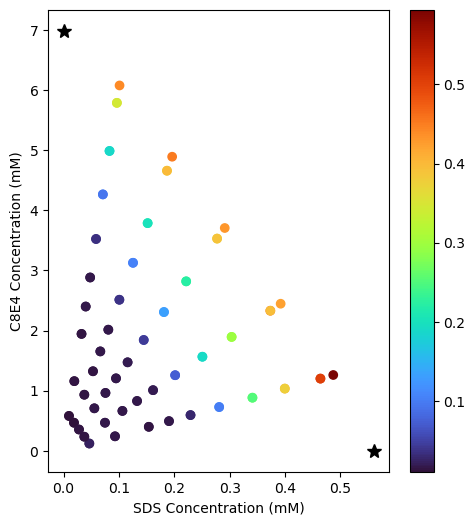

In [77]:
fig, ax = plt.subplots()

X = salt_trials["sds_concentration"]
Y = salt_trials["c8e4_concentration"]
im = ax.scatter(X, Y, c=salt_trials["normalized_fluorescence"], cmap=plt.cm.turbo)

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

# Add a colorbar
fig.colorbar(im, ax=ax)

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")

plt.gcf().set_size_inches(W+1.5, H)

## Analysis Configurations

In [78]:
table = salt_trials

## Physics-based Classification Analysis

### Plane-Fitting

In [79]:
''' equation of plane for "blank region", args as [x, y] '''
def equation_plane(args, a, b, c): return a * args[0] + b * args[1] + c

In [80]:
high_point = 2
x = table[table["trial_number"] <= high_point]["sds_concentration"]
y = table[table["trial_number"] <= high_point]["c8e4_concentration"]
z = table[table["trial_number"] <= high_point]["normalized_fluorescence"]

# bounding by the 99% confidence interval
p, pint, se = nlinfit(equation_plane, [x, y], z, [0.05, 0.05, 0.05], alpha=0.05)

X, Y = [], []
grid_points = 50
for v1 in np.linspace(0, 0.65, grid_points):
  for v2 in np.linspace(0, 5.5, grid_points):
    X.append(v1); Y.append(v2)

In [81]:
fig = GO.Figure()

_ = 6
x = table[table["trial_number"] < _]["sds_concentration"]
y = table[table["trial_number"] < _]["c8e4_concentration"]
z = table[table["trial_number"] < _]["normalized_fluorescence"]

fig.add_trace(GO.Scatter3d(x=x, y=y, z=z, mode="markers",
    marker=dict(size=8, color=table[table["trial_number"] < _]["normalized_fluorescence"],
    cmax=max(table[table["trial_number"] < _]["normalized_fluorescence"]), cmin=0,
    colorbar=dict(title="Colorbar", titleside="bottom"), colorscale="deep")))

Z = equation_plane([np.array(X), np.array(Y)], p[0], p[1], p[2])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z, mode="lines", line=dict(color="red")))

Z_L = equation_plane([np.array(X), np.array(Y)], pint[0][0], pint[1][0], pint[2][0])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z_L, mode="lines", line=dict(color="blue")))

Z_U = equation_plane([np.array(X), np.array(Y)], pint[0][1], pint[1][1], pint[2][1])
fig.add_trace(GO.Scatter3d(x=X, y=Y, z=Z_U, mode="lines", line=dict(color="blue")))

fig.update_layout(
    title="Fluorescence 3D Plot with Blank-Region Plane",
    xaxis_title="SDS Concentration (mM)",
    yaxis_title="C8E4 Concentration (mM)",
    showlegend=False,
    font=dict(family = "Times", color="black", size=16))

fig.show()

In [82]:
X = np.array(table["sds_concentration"])
Y = np.array(table["c8e4_concentration"])
Z = np.array(table["normalized_fluorescence"])
type_labels = np.array(table["type"])

a, b, c = pint[0][1], pint[1][1], pint[2][1]

labels = []
for i in range(len(table)):
  x, y, z = X[i], Y[i], Z[i]
  z_pred = equation_plane([x, y], a, b, c)

  if (z >= z_pred): labels.append(int(1))
  else: labels.append(int(0))

classification_table = pd.DataFrame()
classification_table["sds_concentration"] = X
classification_table["c8e4_concentration"] = Y
classification_table["labels"] = labels
classification_table["type"] = type_labels

classification_table.drop(index=31, inplace=True) # removing outlier point

### Physics-based Classification Analysis

In [83]:
''' physics-based classification model '''
def nst_classification_model(params, args):
  beta = params
  cmc_1, cmc_2, X, Y = args

  classification_predictions = []
  f = implicit_solve_interpolate_nst(cmc_1, cmc_2, beta)

  ''' labeling each x ∈ X as {0, 1} based on position relative to NST curve '''
  for i in range(len(X)):
    x, y = X[i], Y[i]
    unit_vector_slope = y / x

    # getting intersection between x value vector from (0, 0) and NST curve
    def intersection(x): return f(x) - unit_vector_slope * x
    solution = fsolve(intersection, x0=x)

    intersection_x, intersection_y = solution[0], unit_vector_slope * solution[0]

    # classifing each x as 0 or 1 based on orthogonal intersection point
    if x < intersection_x or y < intersection_y:
      classification_predictions.append(int(0))
    else:
      classification_predictions.append(int(1))

  return classification_predictions

In [84]:
''' cross entropy (log) loss for binary classification '''
def log_loss(y_pred, y_true):
  errors = (y_true * np.log10(y_pred + 1E-8)) + ((1 - y_true) * np.log10(1 - y_pred + 1E-8))
  loss = (-1 / (len(y_pred))) * np.sum(errors)
  return loss

In [85]:
''' physics-based classification objective function '''
def nst_classification_objective(params, args):
  y_pred = np.array(nst_classification_model(params, args))
  y_true = np.array(classification_table["labels"])

  return log_loss(y_pred, y_true)

In [86]:
X = classification_table["sds_concentration"].tolist()
Y = classification_table["c8e4_concentration"].tolist()

beta_guess = -3.0   # based on full ReLU analysis
beta_range = np.linspace(2.0 * beta_guess, 0, 50)

L = [nst_classification_objective(_, [cmc_1, cmc_2, X, Y]) for _ in beta_range]

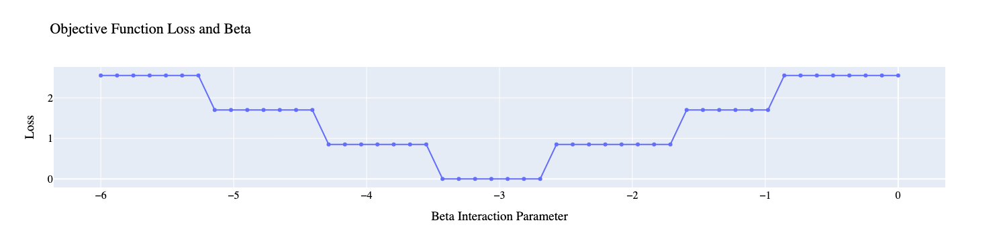

In [87]:
fig = GO.Figure()

fig.add_trace(GO.Scatter(x=beta_range, y=L, mode="lines+markers"))

fig.update_layout(
    title="Objective Function Loss and Beta",
    xaxis_title="Beta Interaction Parameter",
    yaxis_title="Loss",
    font=dict(family = "Times", color="black", size=16))

fig.show()

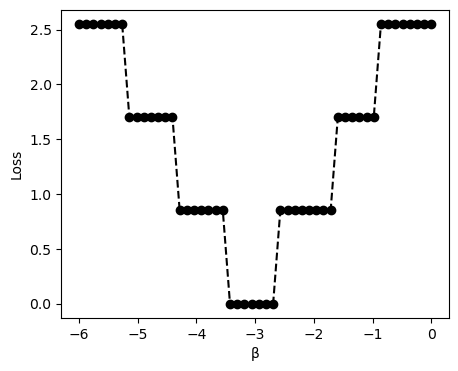

In [88]:
plt.plot(beta_range, L, linestyle="--", marker="o", color="black", )

plt.xlabel("β")
plt.ylabel("Loss")

plt.gcf().set_size_inches(W+1, H-2)

### Physics-based Results

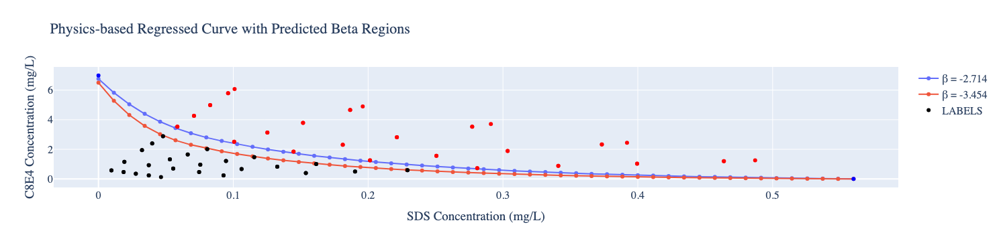

In [89]:
physics_beta_UB = -2.714
physics_beta_LB = -3.454

fig = GO.Figure()

regressed_physics_points = {}
beta_sampling = [physics_beta_UB, physics_beta_LB]

# looping through potiential interaction parameters
for beta in np.round(beta_sampling, 3):

  f = implicit_solve_interpolate_nst(cmc_1, cmc_2, beta)
    
  xs = np.linspace(0, cmc_1, 50)
  ys = np.array(f(xs))  # Ensure ys is a NumPy array
  
  regressed_physics_points[beta] = np.transpose((xs, ys))

''' now filtering and plotting the individual estimated beta curves '''

for beta_trial in regressed_physics_points:
  # plotting the nonideal solution theory estimated mixed cmc results
  trial_name = "β = " + str(beta_trial)
  fig.add_trace(GO.Scatter(x=[x for x, _ in regressed_physics_points[beta_trial]],
      y=[y for _, y in regressed_physics_points[beta_trial]],
      mode="lines+markers", name=trial_name))

# plotting the classification labeled points
fig.add_trace(GO.Scatter(
    x=X, y=Y, mode="markers", name="LABELS",
    marker=dict(size=6, color=classification_table["labels"], showscale=False,
                cmax=1, cmin=0, colorbar=dict(title="Colorbar",
                titleside="bottom"), colorscale=[[0, "black"], [1.0, "red"]])))

fig.add_trace(GO.Scatter(x=[cmc_1], y=[0], mode="markers", name="SDS CMC",
    line=dict(color="blue"), showlegend=False))

fig.add_trace(GO.Scatter(x=[0], y=[cmc_2], mode="markers", name="C8E4 CMC",
    line=dict(color="blue"), showlegend=False))

fig.update_layout(
    title_text="Physics-based Regressed Curve with Predicted Beta Regions",
    xaxis_title="SDS Concentration (mg/L)",
    yaxis_title="C8E4 Concentration (mg/L)",
    font=dict(family = "Times", size=16),
    showlegend=True)

fig.show()

In [90]:
keys = list(regressed_physics_points.keys())

f_U = interpolate.interp1d(
    [x for x, _ in regressed_physics_points[keys[0]]],
    [y for _, y in regressed_physics_points[keys[0]]],
    kind="cubic", fill_value="extrapolate")
f_L = interpolate.interp1d(
    [x for x, _ in regressed_physics_points[keys[1]]],
    [y for _, y in regressed_physics_points[keys[1]]],
    kind="cubic", fill_value="extrapolate")

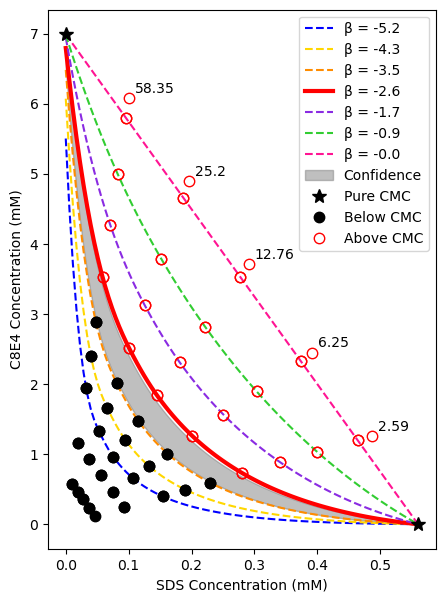

In [91]:
fig, ax = plt.subplots()

colors = ["red", "darkorange", "gold", "limegreen", "blue", "blueviolet", "deeppink"]
shuffle(colors)

# plotting nonideal solution theory estimated cmc curves
for i, beta in enumerate(beta_function_mapping):
  trial_name = "β = " + str(beta)

  f     = beta_function_mapping[beta]
  xs    = np.linspace(0, cmc_1, 100)
  ys    = f(xs)

  if (beta == -2.6): plt.plot(xs, ys, color=colors[i], linewidth=3, label=trial_name)
  else: plt.plot(xs, ys, color=colors[i], linestyle="dashed", label=trial_name)


''' plotting LB and UB beta curves '''
X = np.linspace(0, cmc_1, 100)
ax.fill_between(X, f_U(X), f_L(X), color="gray", alpha=0.5)

# adding pure surfactant CMCs
plt.plot([0, cmc_1], [cmc_2, 0], "*", color="black", markersize=10)

# adding classification-labeled data
reds    = classification_table[classification_table["labels"] == 1]
blacks  = classification_table[classification_table["labels"] == 0]
plt.plot(blacks["sds_concentration"], blacks["c8e4_concentration"], ".", color="black", fillstyle="full", markersize=15)
plt.plot(reds["sds_concentration"], reds["c8e4_concentration"], ".", color="red", fillstyle="none", markersize=15)

# adding annotation for ray line blend ratio
for chi in set(classification_table["type"]): # looping over the five ray lines
  chi_table = classification_table[classification_table["type"] == chi].sort_values(
      by="sds_concentration", ascending=False)

  plt.annotate(
      f"{np.round(float(chi), 2)}", # ray line blend ratio
      xy=(chi_table.iloc[0]["sds_concentration"], chi_table.iloc[0]["c8e4_concentration"]),
      xytext=(4, 4),                # distance from the point, in points
      textcoords="offset points",   # interpreting text position as offset in points from annotated point
      ha="left",                    # horizontal alignment
      va="baseline"                 # vertical alignment
  )

plt.xlabel("SDS Concentration (mM)")
plt.ylabel("C8E4 Concentration (mM)")
plt.legend(["β = -5.2", "β = -4.3", "β = -3.5", "β = -2.6", "β = -1.7", "β = -0.9", "β = -0.0",
            "Confidence", "Pure CMC", "Below CMC", "Above CMC"])

plt.tight_layout()
plt.savefig('../figures/fig-bin-electrolyte.png', dpi=300)

# Pure CMC Determination (Table 1)

In [92]:
# deleting all local variables in order to setup pure CMC experiment
%reset -f

In [93]:
''' specifying matplotlib figure dimensions '''
W, H = 4, 6

## Libraries

In [94]:
import random
import numpy as np
import pandas as pd

from pycse import nlinfit

import matplotlib.pyplot as plt
import plotly.graph_objects as GO
from plotly.subplots import make_subplots

def shuffle(L): return random.Random(0).shuffle(L)

## Design Setup

In [95]:
n_trials = 12
vial_volume = 1.0       # mL
vol_dye_mL = 0.020      # mL

''' Hexanol Calculations '''
hex_MM = 102.17                       # g/mol
density_hex_solution = 0.814          # g/mL
desired_hex_concentration = 0.060     # M (60 mM)
vol_hex_mL = ((vial_volume / 1000) * desired_hex_concentration * hex_MM) / density_hex_solution
vol_hex_uL = np.round(vol_hex_mL * 1000, 1)
print(f"Hexanol Volume (uL): {vol_hex_uL}")

''' NaCl Calculations '''
nacl_stock = 4.03026                # M
desired_nacl_concentration = 0.5    # M
vol_nacl_mL = np.round((desired_nacl_concentration / nacl_stock) * vial_volume, 3)
print(f"NaCl Stock Volume (mL): {vol_nacl_mL}")

Hexanol Volume (uL): 7.5
NaCl Stock Volume (mL): 0.124


In [96]:
''' C8E4-HEXANOL CALCULATIONS '''
guess_c8e4_cmc_x = 1.0        # mM
c8e4_x_bounds = np.linspace(-0.75, 2.75, n_trials)
c8e4_hex_sampling_1 = [(e * guess_c8e4_cmc_x + guess_c8e4_cmc_x) for e in c8e4_x_bounds]
print("C8E4-Hexanol Sampling (mM): " + str([np.round(e, 3) for e in c8e4_hex_sampling_1]))

''' C8E4-NaCl CALCULATIONS '''
guess_c8e4_cmc_nacl = 7.5     # mM
c8e4_nacl_bounds = np.linspace(-0.275, 0.275, n_trials)
c8e4_nacl_sampling = [(e * guess_c8e4_cmc_nacl + guess_c8e4_cmc_nacl) for e in c8e4_nacl_bounds]
print("C8E4-NaCl Sampling (mM): " + str([np.round(e, 3) for e in c8e4_nacl_sampling]))

C8E4-Hexanol Sampling (mM): [0.25, 0.568, 0.886, 1.205, 1.523, 1.841, 2.159, 2.477, 2.795, 3.114, 3.432, 3.75]
C8E4-NaCl Sampling (mM): [5.438, 5.812, 6.188, 6.562, 6.938, 7.312, 7.688, 8.062, 8.438, 8.812, 9.188, 9.562]


In [97]:
''' generating my plate indicies '''
plate_index_1 = ["A", "B", "C", "D", "E", "F", "G", "H"]
plate_index_2 = [str(i) for i in range(1, 13)]

for _ in range(5): shuffle(plate_index_1); shuffle(plate_index_2);
plate_order = [letter + number for letter in plate_index_1 for number in plate_index_2]

''' generating C8E4 sample labels '''
sample_labels = []

for env_name in ["NaCl", "X"]:
  for trial in range(12):
    if trial < 11:
      for replicate in range(4):
        sample_labels.append(env_name + "-C8E4-" + str(trial + 1) + "-" + str(replicate + 1))
    else:
      for replicate in range(3):
        sample_labels.append(env_name + "-C8E4-" + str(trial + 1) + "-" + str(replicate + 1))

sample_labels.extend(["IFS", "IFS"])

''' shuffling and tabulating the plate setup '''
for _ in range(75): shuffle(plate_order)
for _ in range(25): shuffle(sample_labels)

data_dict = {"index" : plate_order, "sample_id" : sample_labels}
c8e4_plate_setup = pd.DataFrame(data_dict)

c8e4_plate_setup

,index,sample_id
0,C12,NaCl-C8E4-8-2
1,C3,NaCl-C8E4-6-1
2,A12,X-C8E4-6-3
3,D12,X-C8E4-6-4
4,E1,NaCl-C8E4-5-2
...,...,...
91,H7,X-C8E4-5-4
92,G5,NaCl-C8E4-6-2
93,D2,NaCl-C8E4-11-3
94,D6,X-C8E4-5-2


## Data Preprocessing

In [98]:
''' unpacks trial labels (from the results_table dataframe),
      according to the specified design above '''
def map_results(results_table):
  ''' expanding the sample_id column to its chi, trial number, and replicate '''
  sample_type, trial_n, concentration, replicate_n = [], [], [], []
  for label in results_table["sample_id"]:
    label_info = label.split("-")

    sample_type.append(label_info[0])

    if (label_info[0] == "X"):
      trial_n.append(int(label_info[2]))
      concentration.append(np.round(c8e4_hex_sampling_1[int(label_info[2]) - 1], 3))
      replicate_n.append(int(label_info[3]))

    elif (label_info[0] == "NaCl"):
      trial_n.append(int(label_info[2]))
      concentration.append(np.round(c8e4_nacl_sampling[int(label_info[2]) - 1], 3))
      replicate_n.append(int(label_info[3]))

    else: # IFS
      trial_n.append(int(0))
      concentration.append(int(0))
      replicate_n.append(int(0))

  ''' aggregating the current measurment sample information '''
  results = results_table.copy()
  results["type"] = sample_type
  results["trial_number"] = trial_n
  results["concentration"] = concentration
  results["replicate"] = replicate_n

  ifs = np.mean(results[results["type"] == "IFS"]["fluorescence"])
  results.drop(results[results["type"] == "IFS"].index, inplace = True)
  results["normalized_fluorescence"] = results["fluorescence"] / ifs

  return results

In [99]:
''' @brief reads in the raw excel file, matches plate indicies to measured
      fluorescence values, and uses map_results() to unpack trial labels '''
def read_microplate_data(filename, experiment_setup):
  ''' formatting MicroPlate reader data '''
  data_table = pd.read_excel(filename)

  ''' dropping useless first column from dataframes '''
  data_table = data_table.iloc[:, 1:]

  ''' dropping useless last column from results dataframe '''
  data_table = data_table.iloc[:, :-1]

  ''' reindexing the table to match plate indicies '''
  data_table.index = ["A", "B", "C", "D", "E", "F", "G", "H"]

  ''' mapping tabular fluorescence results into reformatted dataframe '''
  results_mapping = []
  for letter_index in data_table.index:
    for number_index in data_table.columns:
      item = (letter_index, str(number_index), data_table[number_index][letter_index])
      results_mapping.append(item)

  fluorescence_table = pd.DataFrame(results_mapping, columns=["row", "column", "fluorescence"])

  ''' reformatting the experiment_setup to match format of fluorescence_table '''
  labels = experiment_setup["sample_id"].tolist()
  indicies = [(plate_index[0], plate_index[1:])for plate_index in experiment_setup["index"].tolist()]
  experiment_design_setup = pd.DataFrame(indicies, columns=["row", "column"])
  experiment_design_setup["sample_id"] = labels

  ''' joining design_table and fluorescence_table '''
  results_table = pd.merge(experiment_design_setup, fluorescence_table,  how='left',
                    left_on=["row", "column"], right_on = ["row", "column"])

  output_table = map_results(results_table)

  return output_table

In [100]:
measure_1 = read_microplate_data("pseudo-unary-c8e4-MP1.xlsx", c8e4_plate_setup)
measure_2 = read_microplate_data("pseudo-unary-c8e4-MP2.xlsx", c8e4_plate_setup)
measure_3 = read_microplate_data("pseudo-unary-c8e4-MP3.xlsx", c8e4_plate_setup)
measure_4 = read_microplate_data("pseudo-unary-c8e4-MP4.xlsx", c8e4_plate_setup)
measure_5 = read_microplate_data("pseudo-unary-c8e4-MP5.xlsx", c8e4_plate_setup)

aggregate_table = pd.DataFrame()

aggregate_table["row"] = measure_1["row"]
aggregate_table["column"] = measure_1["column"]
aggregate_table["sample_id"] = measure_1["sample_id"]

aggregate_table["type"] = measure_1["type"]
aggregate_table["trial_number"] = measure_1["trial_number"]
aggregate_table["replicate"] = measure_1["replicate"]

aggregate_table["concentration"] = measure_1["concentration"]

aggregate_table["scan-1"] = measure_1["normalized_fluorescence"]
aggregate_table["scan-2"] = measure_2["normalized_fluorescence"]
aggregate_table["scan-3"] = measure_3["normalized_fluorescence"]
aggregate_table["scan-4"] = measure_4["normalized_fluorescence"]
aggregate_table["scan-5"] = measure_5["normalized_fluorescence"]

aggregate_table["average_fluorescence"] = np.mean(
    [aggregate_table["scan-1"],
     aggregate_table["scan-2"],
     aggregate_table["scan-3"],
     aggregate_table["scan-4"],
     aggregate_table["scan-5"]], axis=0)

aggregate_table["fluorescence_stdev"] = np.std(
    [aggregate_table["scan-1"],
     aggregate_table["scan-2"],
     aggregate_table["scan-3"],
     aggregate_table["scan-4"],
     aggregate_table["scan-5"]], axis=0, dtype=np.float64)

''' splitting aggregated data to pull the NaCl system '''
c8e4_nacl_table = aggregate_table[aggregate_table["type"] == "NaCl"]

## ReLU Analysis

In [101]:
def leaky_relu(x, a): return np.where(x > 0, x, a * x)

def model(x, i0, a, m, cmc):
  if a >= 0 and m >= 0: # piecewise shape constraints for ReLU shape
    return i0 + m * leaky_relu(x - cmc, a)

  return np.inf

Averaged Model Parameters and Parameter Errors:
PARAMS: [0.057792891176838494, 0.13087530268059633, 0.2731219101108453, 6.986258794752543]
ERRORS: [0.022433685598345875, 0.07383100079617676, 0.009237031591482961, 0.10148810728837993]


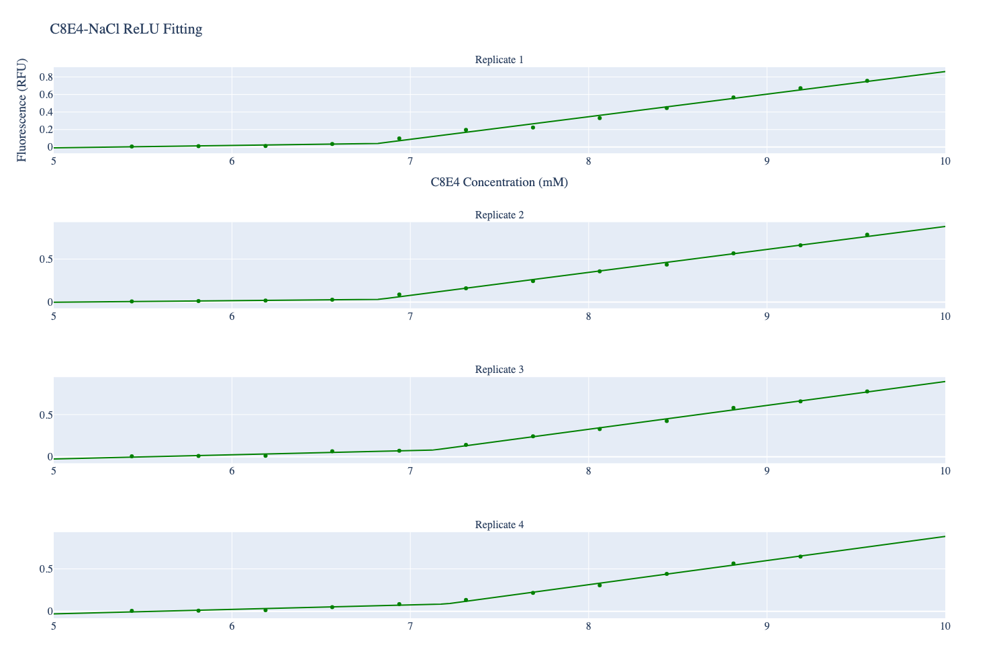

In [102]:
n_replicates = 4
table = c8e4_nacl_table
fig = make_subplots(rows=n_replicates, cols=1, subplot_titles=(
    "Replicate 1", "Replicate 2", "Replicate 3", "Replicate 4"))

params, errors = [], []
for i in range(n_replicates):
  temp_table = table[table["replicate"] == i + 1]

  x = temp_table["concentration"].tolist()

  y = temp_table["average_fluorescence"].tolist()

  p, pint, se = nlinfit(model, x, y, [0, 0.05, 0.25, 6.5])  # initial guesses
  params.append(p)
  errors.append(se)

  # plotting individual trial model
  X = np.linspace(5, 10, 100)
  fig.add_trace(GO.Scatter(x=X, y=model(X, p[0], p[1], p[2], p[3]),
      name="Replicate #" + str(i+1) + " Model", mode="lines",
      marker=dict(color="green")), row=i+1, col=1)

  # plotting trial data
  fig.add_trace(GO.Scatter(x=x, y=y, name="Replicate #" + str(i+1),
      mode="markers", marker=dict(color="green")), row=i+1, col=1)

p1, p2, p3, p4 = 0, 0, 0, 0
e1, e2, e3, e4 = 0, 0, 0, 0

# averaging the replicate trials
for i in range(n_replicates):
  p1 += params[i][0]; p2 += params[i][1]; p3 += params[i][2]; p4 += params[i][3]
  e1 += errors[i][0]; e2 += errors[i][1]; e3 += errors[i][2]; e4 += errors[i][3]

p1 /= n_replicates; p2 /= n_replicates; p3 /= n_replicates; p4 /= n_replicates;
e1 /= n_replicates; e2 /= n_replicates; e3 /= n_replicates; e4 /= n_replicates;

print("Averaged Model Parameters and Parameter Errors:")
print(f"PARAMS: {[p1, p2, p3, p4]}")
print(f"ERRORS: {[e1, e2, e3, e4]}")

fig.update_layout(
    height=1000,
    title_text="C8E4-NaCl ReLU Fitting",
    xaxis_title="C8E4 Concentration (mM)",
    yaxis_title="Fluorescence (RFU)",
    font=dict(family = "Times", size=16),
    showlegend=False)

fig.show()

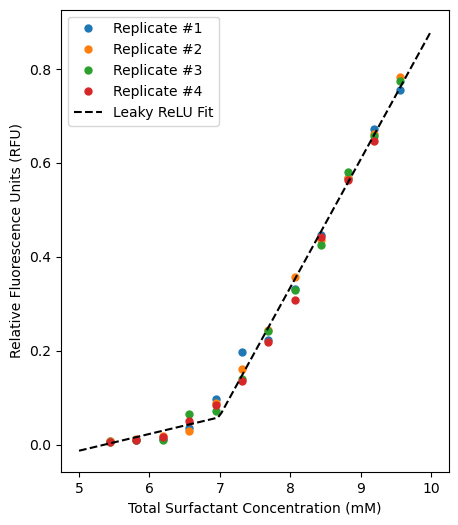

In [103]:
# adding trial data points
for i in range(n_replicates):
  x = list(table[(table["replicate"] == i + 1)]["concentration"])
  y = list(table[(table["replicate"] == i + 1)]["average_fluorescence"])

  plt.plot(x, y, ".", markersize=10)

# adding trendline curve
X = np.linspace(5.0, 10.0, 100)
plt.plot(X, model(X, *(p1, p2, p3, p4)), "--", color="black", markersize=10, )

plt.legend(["Replicate #1", "Replicate #2", "Replicate #3", "Replicate #4", "Leaky ReLU Fit"], loc="upper left")

plt.xlabel("Total Surfactant Concentration (mM)")
plt.ylabel("Relative Fluorescence Units (RFU)")

plt.gcf().set_size_inches(W+1, H)

plt.show()

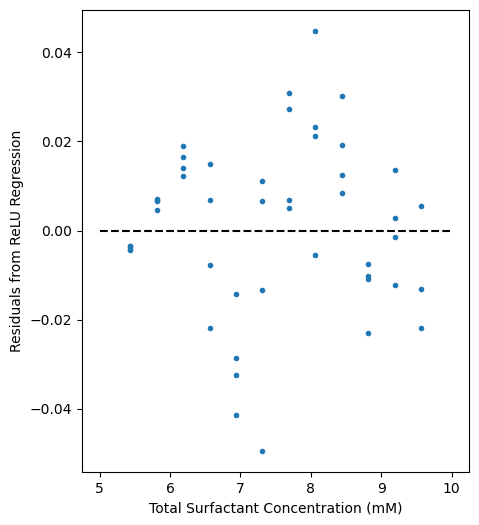

In [104]:
xs = list(table["concentration"])
ys = list(table["average_fluorescence"])

residuals = []
for i, v in enumerate(xs):

    # residual = expected - actual
    residual = model(v, *(p1, p2, p3, p4)) - ys[i]
    residuals.append(residual)

plt.plot(xs, residuals, ".")

plt.hlines(y=0, xmin=5.0, xmax=10.0, color="black", linestyles="dashed")

plt.xlabel("Total Surfactant Concentration (mM)")
plt.ylabel("Residuals from ReLU Regression")

plt.gcf().set_size_inches(W+1, H)